In [1]:
#pip install tqdm

In [6]:
import os
print(os.listdir("./input"))

['abc', '.DS_Store', 'images', 'ALL-DOGS', '.ipynb_checkpoints']


In [7]:
from __future__ import print_function
import time
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
import matplotlib.pyplot as plt
import numpy as np
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm import tqdm_notebook as tqdm

There are 152 pictures of dogs.


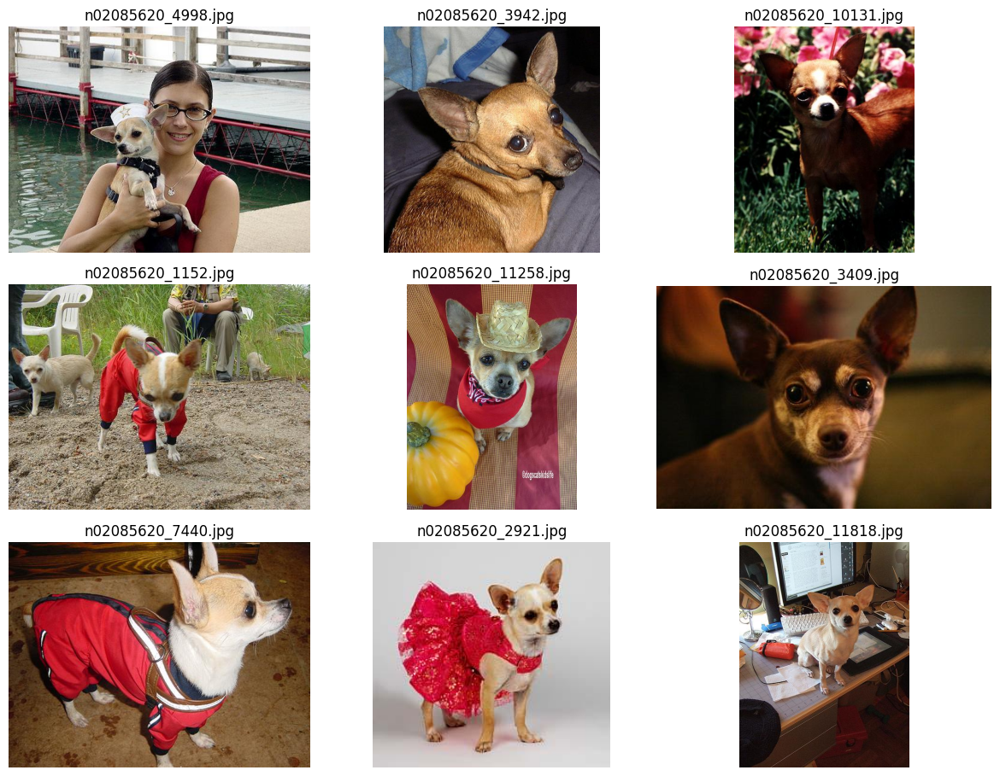

In [8]:
PATH = './input/images/Images/n02085620-Chihuahua/'
images = os.listdir(PATH)
print(f'There are {len(os.listdir(PATH))} pictures of dogs.')

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,10))

for indx, axis in enumerate(axes.flatten()):
    rnd_indx = np.random.randint(0, len(os.listdir(PATH)))
    # https://matplotlib.org/users/image_tutorial.html
    img = plt.imread(PATH + images[rnd_indx])
    imgplot = axis.imshow(img)
    axis.set_title(images[rnd_indx])
    axis.set_axis_off()
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

In [9]:
batch_size = 32
image_size = 64

random_transforms = [transforms.ColorJitter(), transforms.RandomRotation(degrees=20)]
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.RandomHorizontalFlip(p=0.5),
                                transforms.RandomApply(random_transforms, p=0.2),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder('./input/images/Images/', transform=transform)
train_loader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)
                                           
imgs, label = next(iter(train_loader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


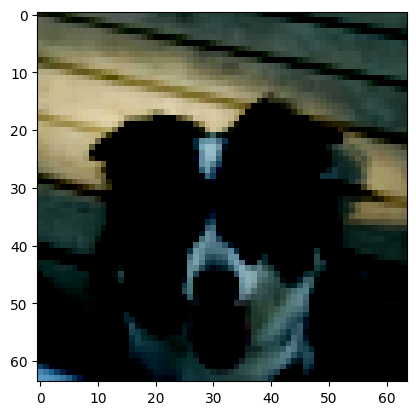

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


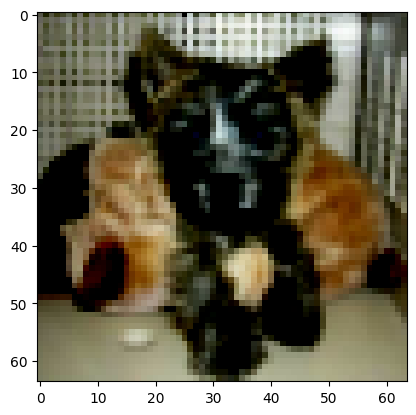

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


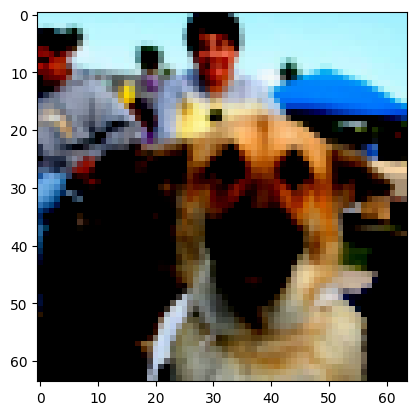

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


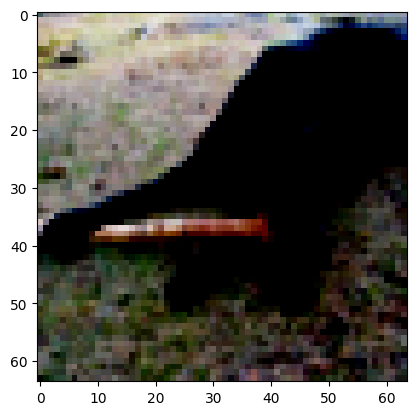

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


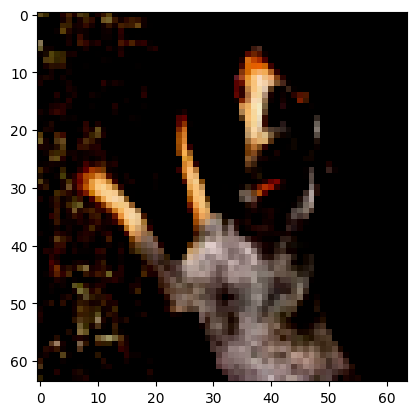

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


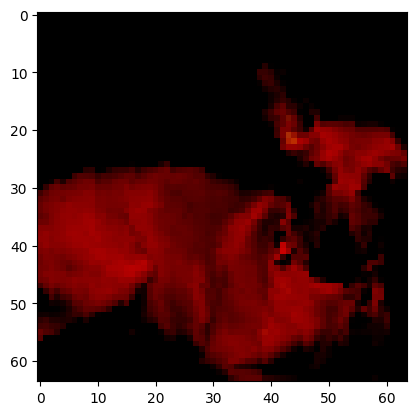

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


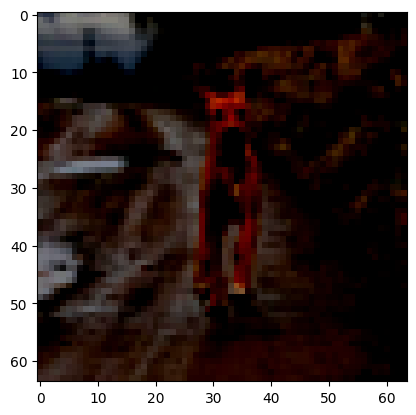

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


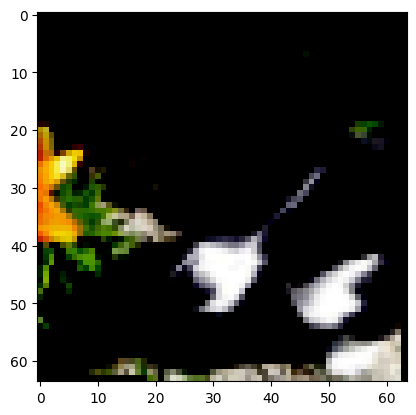

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


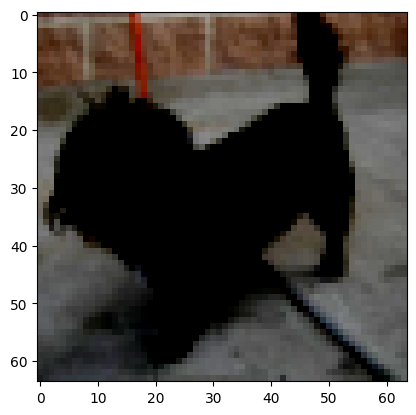

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


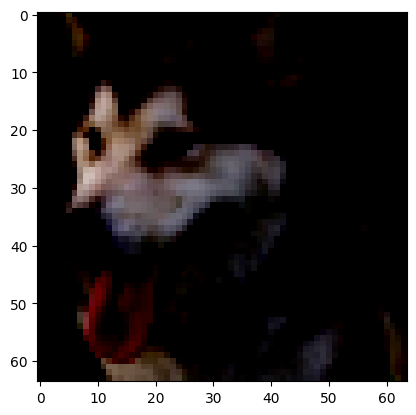

In [10]:
for i in range(10):
    plt.imshow(imgs[i])
    plt.show()

In [7]:
def weights_init(m):
    """
    Takes as input a neural network m that will initialize all its weights.
    """
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [8]:
class G(nn.Module):
    def __init__(self):
        # Used to inherit the torch.nn Module
        super(G, self).__init__()
        # Meta Module - consists of different layers of Modules
        self.main = nn.Sequential(
                nn.ConvTranspose2d(100, 512, 4, stride=1, padding=0, bias=False),
                nn.BatchNorm2d(512),
                nn.ReLU(True),
                nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.ReLU(True),
                nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.ReLU(True),
                nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(64),
                nn.ReLU(True),
                nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1, bias=False),
                nn.Tanh()
                )
        
    def forward(self, input):
        output = self.main(input)
        return output

# Creating the generator
netG = G()
netG.apply(weights_init)

G(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

In [9]:
# Defining the discriminator
class D(nn.Module):
    def __init__(self):
        super(D, self).__init__()
        self.main = nn.Sequential(
                nn.Conv2d(3, 64, 4, stride=2, padding=1, bias=False),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(64, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(128, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(256, 512, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(512, 1, 4, stride=1, padding=0, bias=False),
                nn.Sigmoid()
                )
        
    def forward(self, input):
        output = self.main(input)
        # .view(-1) = Flattens the output into 1D instead of 2D
        return output.view(-1)
    
    
# Creating the discriminator
netD = D()
netD.apply(weights_init)

D(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

In [11]:
class Generator(nn.Module):
    def __init__(self, nz=128, channels=3):
        super(Generator, self).__init__()
        
        self.nz = nz
        self.channels = channels
        
        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0):
            block = [
                nn.ConvTranspose2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False),
                nn.BatchNorm2d(n_output),
                nn.ReLU(inplace=True),
            ]
            return block

        self.model = nn.Sequential(
            *convlayer(self.nz, 1024, 4, 1, 0), # Fully connected layer via convolution.
            *convlayer(1024, 512, 4, 2, 1),
            *convlayer(512, 256, 4, 2, 1),
            *convlayer(256, 128, 4, 2, 1),
            *convlayer(128, 64, 4, 2, 1),
            nn.ConvTranspose2d(64, self.channels, 3, 1, 1),
            nn.Tanh()
        )

    def forward(self, z):
        z = z.view(-1, self.nz, 1, 1)
        img = self.model(z)
        return img

    
class Discriminator(nn.Module):
    def __init__(self, channels=3):
        super(Discriminator, self).__init__()
        
        self.channels = channels

        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0, bn=False):
            block = [nn.Conv2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False)]
            if bn:
                block.append(nn.BatchNorm2d(n_output))
            block.append(nn.LeakyReLU(0.2, inplace=True))
            return block

        self.model = nn.Sequential(
            *convlayer(self.channels, 32, 4, 2, 1),
            *convlayer(32, 64, 4, 2, 1),
            *convlayer(64, 128, 4, 2, 1, bn=True),
            *convlayer(128, 256, 4, 2, 1, bn=True),
            nn.Conv2d(256, 1, 4, 1, 0, bias=False),  # FC with Conv.
        )

    def forward(self, imgs):
        logits = self.model(imgs)
        out = torch.sigmoid(logits)
    
        return out.view(-1, 1)

In [15]:
!mkdir results
!ls

mkdir: results: File exists
GANs1.ipynb       generator.pth     input
discriminator.pth images.zip        results


In [12]:
EPOCH = 0# play with me
LR = 0.001
criterion = nn.BCELoss()
optimizerD = optim.Adam(netD.parameters(), lr=LR, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR, betas=(0.5, 0.999))

In [13]:
for epoch in range(EPOCH):
    for i, data in enumerate(train_loader, 0):
        # 1st Step: Updating the weights of the neural network of the discriminator
        netD.zero_grad()
        
        # Training the discriminator with a real image of the dataset
        real,_ = data
        input = Variable(real)
        target = Variable(torch.ones(input.size()[0]))
        output = netD(input)
        errD_real = criterion(output, target)
        
        # Training the discriminator with a fake image generated by the generator
        noise = Variable(torch.randn(input.size()[0], 100, 1, 1))
        fake = netG(noise)
        target = Variable(torch.zeros(input.size()[0]))
        output = netD(fake.detach())
        errD_fake = criterion(output, target)
        
        # Backpropagating the total error
        errD = errD_real + errD_fake
        errD.backward()
        optimizerD.step()
        
        # 2nd Step: Updating the weights of the neural network of the generator
        netG.zero_grad()
        target = Variable(torch.ones(input.size()[0]))
        output = netD(fake)
        errG = criterion(output, target)
        errG.backward()
        optimizerG.step()
        
        # 3rd Step: Printing the losses and saving the real images and the generated images of the minibatch every 100 steps
        print('[%d/%d][%d/%d] Loss_D: %.4f; Loss_G: %.4f' % (epoch, EPOCH, i, len(train_loader), errD.item(), errG.item()))
        if i % 100 == 0:
            vutils.save_image(real, '%s/real_samples.png' % "./results", normalize=True)
            fake = netG(noise)
            vutils.save_image(fake.data, '%s/fake_samples_epoch_%03d.png' % ("./results", epoch), normalize=True)

In [17]:
batch_size = 32
LR_G = 0.001
LR_D = 0.0005

beta1 = 0.5
epochs = 100

real_label = 0.9
fake_label = 0
nz = 128

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [15]:
netG = Generator(nz).to(device)
netD = Discriminator().to(device)

criterion = nn.BCELoss()

optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(beta1, 0.999))

fixed_noise = torch.randn(25, nz, 1, 1, device=device)

G_losses = []
D_losses = []
epoch_time = []

In [16]:
def plot_loss (G_losses, D_losses, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH "+ str(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

In [17]:
def show_generated_img(n_images=5):
    sample = []
    for _ in range(n_images):
        noise = torch.randn(1, nz, 1, 1, device=device)
        gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
        gen_image = gen_image.numpy().transpose(1, 2, 0)
        sample.append(gen_image)
    
    figure, axes = plt.subplots(1, len(sample), figsize = (64,64))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample[index]
        axis.imshow(image_array)
        
    plt.show()
    plt.close()


/var/folders/lc/3n_fmk7n62q51qpxhqpj9jg80000gp/T/ipykernel_1362/3996935824.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):


  0%|          | 0/644 [00:00<?, ?it/s]

[1/100][322/644] Loss_D: 1.4518 Loss_G: 0.8786 D(x): 0.4888 D(G(z)): 0.4895 / 0.4128
[1/100][644/644] Loss_D: 1.5739 Loss_G: 1.5897 D(x): 0.4370 D(G(z)): 0.4929 / 0.2092


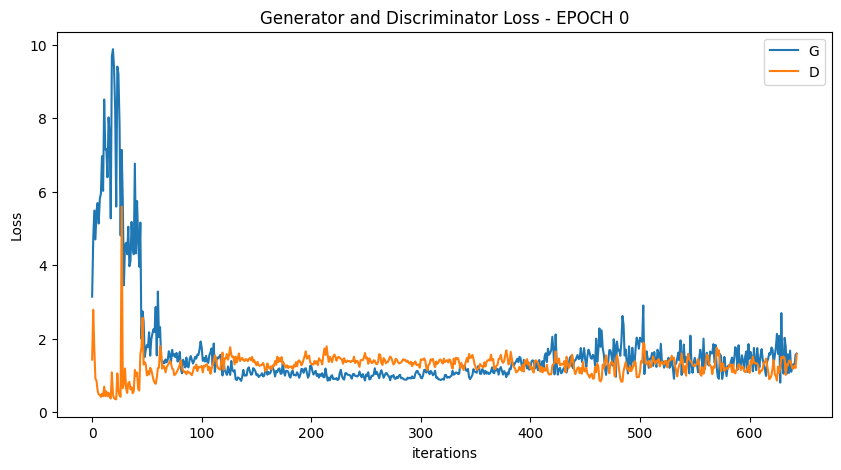

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


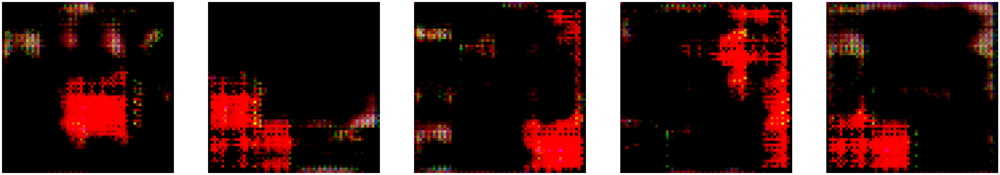

  0%|          | 0/644 [00:00<?, ?it/s]

[2/100][322/644] Loss_D: 1.3802 Loss_G: 1.2535 D(x): 0.6206 D(G(z)): 0.5241 / 0.2746
[2/100][644/644] Loss_D: 1.3625 Loss_G: 2.4001 D(x): 0.3861 D(G(z)): 0.3122 / 0.0863


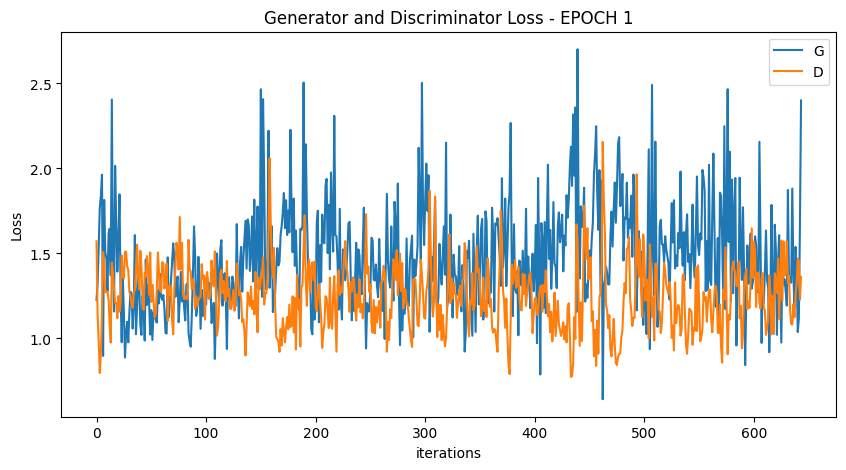

  0%|          | 0/644 [00:00<?, ?it/s]

[3/100][322/644] Loss_D: 1.5090 Loss_G: 1.0209 D(x): 0.5230 D(G(z)): 0.5160 / 0.3625
[3/100][644/644] Loss_D: 1.3691 Loss_G: 0.9326 D(x): 0.3345 D(G(z)): 0.2783 / 0.3861


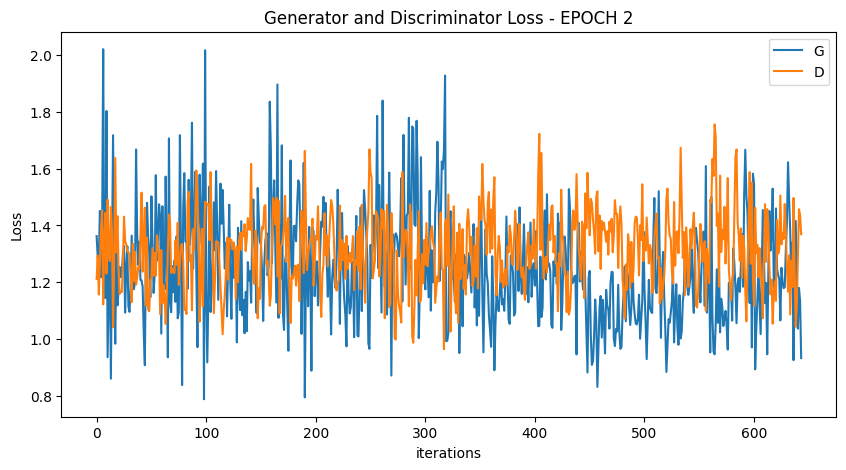

  0%|          | 0/644 [00:00<?, ?it/s]

[4/100][322/644] Loss_D: 1.3381 Loss_G: 1.1732 D(x): 0.5205 D(G(z)): 0.4622 / 0.2971
[4/100][644/644] Loss_D: 1.5241 Loss_G: 1.0462 D(x): 0.3615 D(G(z)): 0.4058 / 0.3348


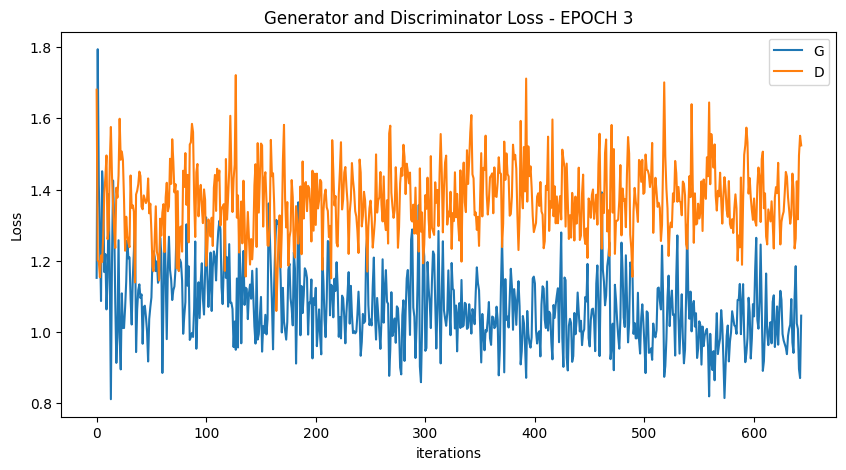

  0%|          | 0/644 [00:00<?, ?it/s]

[5/100][322/644] Loss_D: 1.3467 Loss_G: 1.0447 D(x): 0.5371 D(G(z)): 0.4882 / 0.3404
[5/100][644/644] Loss_D: 1.5682 Loss_G: 1.2685 D(x): 0.3874 D(G(z)): 0.4753 / 0.2630


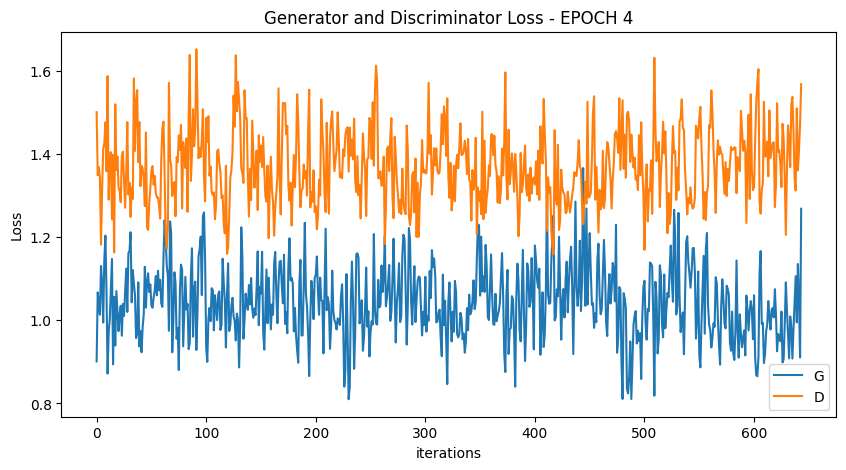

  0%|          | 0/644 [00:00<?, ?it/s]

[6/100][322/644] Loss_D: 1.4192 Loss_G: 0.9234 D(x): 0.4294 D(G(z)): 0.4233 / 0.3971
[6/100][644/644] Loss_D: 1.5746 Loss_G: 1.3905 D(x): 0.4414 D(G(z)): 0.5078 / 0.2252


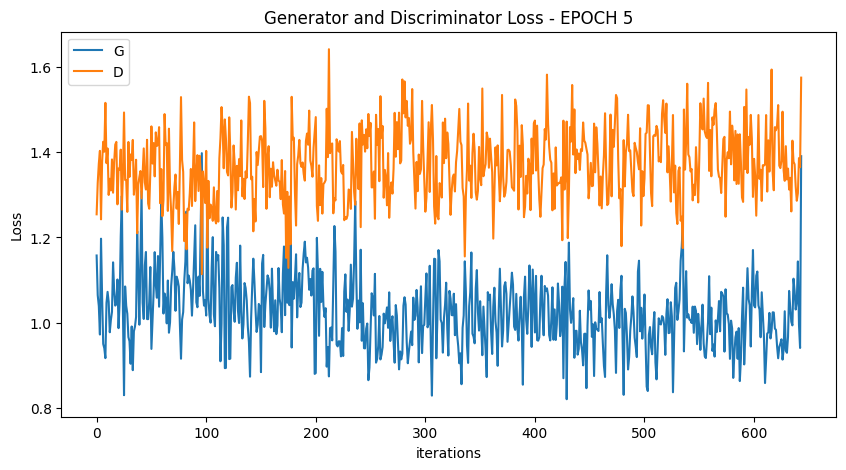

  0%|          | 0/644 [00:00<?, ?it/s]

[7/100][322/644] Loss_D: 1.4532 Loss_G: 0.9866 D(x): 0.4411 D(G(z)): 0.4551 / 0.3626
[7/100][644/644] Loss_D: 1.5566 Loss_G: 1.1100 D(x): 0.3048 D(G(z)): 0.3576 / 0.3064


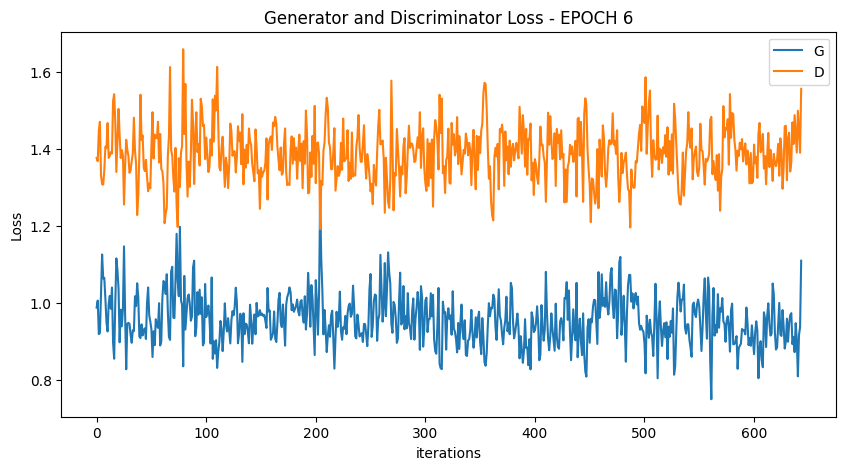

  0%|          | 0/644 [00:00<?, ?it/s]

[8/100][322/644] Loss_D: 1.3285 Loss_G: 1.0106 D(x): 0.4793 D(G(z)): 0.4357 / 0.3552
[8/100][644/644] Loss_D: 1.7589 Loss_G: 0.9727 D(x): 0.2813 D(G(z)): 0.4336 / 0.3748


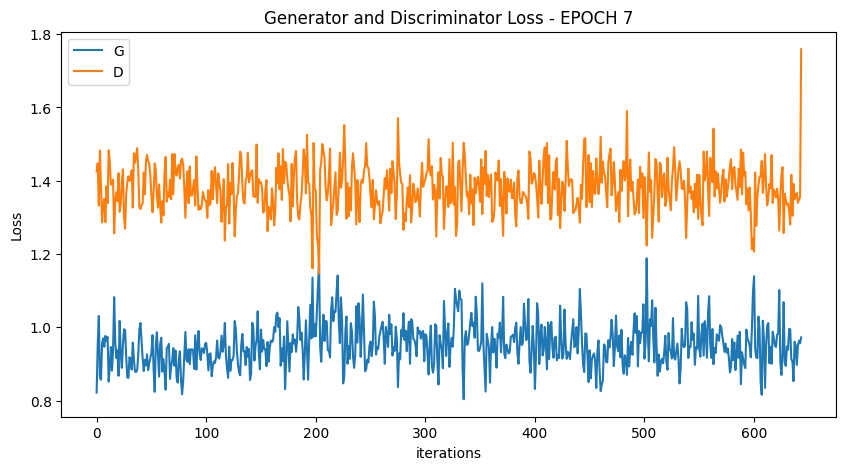

  0%|          | 0/644 [00:00<?, ?it/s]

[9/100][322/644] Loss_D: 1.4031 Loss_G: 0.9554 D(x): 0.4777 D(G(z)): 0.4682 / 0.3760
[9/100][644/644] Loss_D: 1.5045 Loss_G: 1.8739 D(x): 0.5330 D(G(z)): 0.5470 / 0.1305


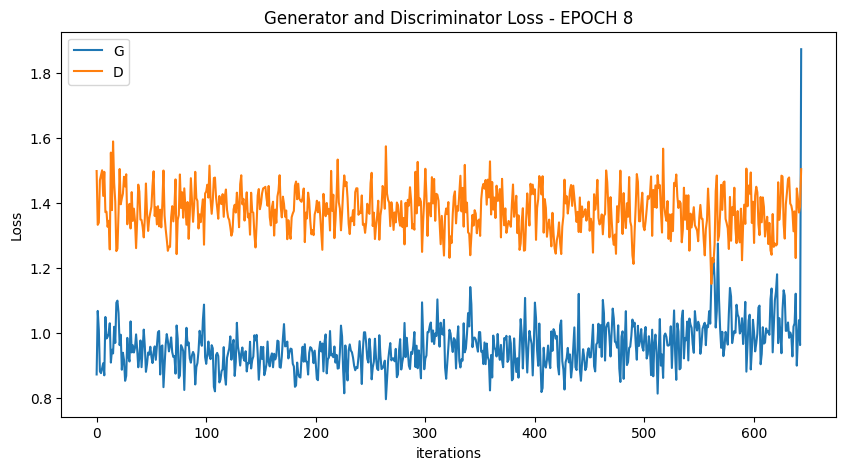

  0%|          | 0/644 [00:00<?, ?it/s]

[10/100][322/644] Loss_D: 1.3871 Loss_G: 1.0366 D(x): 0.4678 D(G(z)): 0.4423 / 0.3474
[10/100][644/644] Loss_D: 1.4859 Loss_G: 1.4863 D(x): 0.3841 D(G(z)): 0.4162 / 0.1985


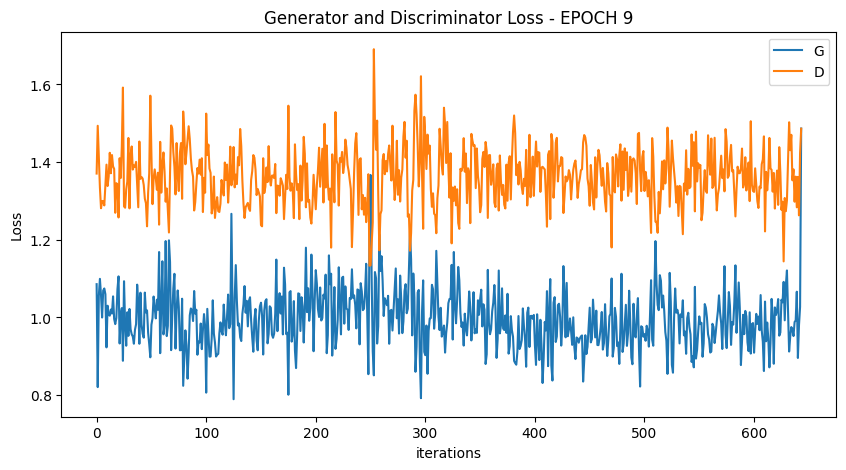

  0%|          | 0/644 [00:00<?, ?it/s]

[11/100][322/644] Loss_D: 1.3665 Loss_G: 0.9943 D(x): 0.4561 D(G(z)): 0.4274 / 0.3619
[11/100][644/644] Loss_D: 1.9312 Loss_G: 1.3497 D(x): 0.3161 D(G(z)): 0.5459 / 0.2660


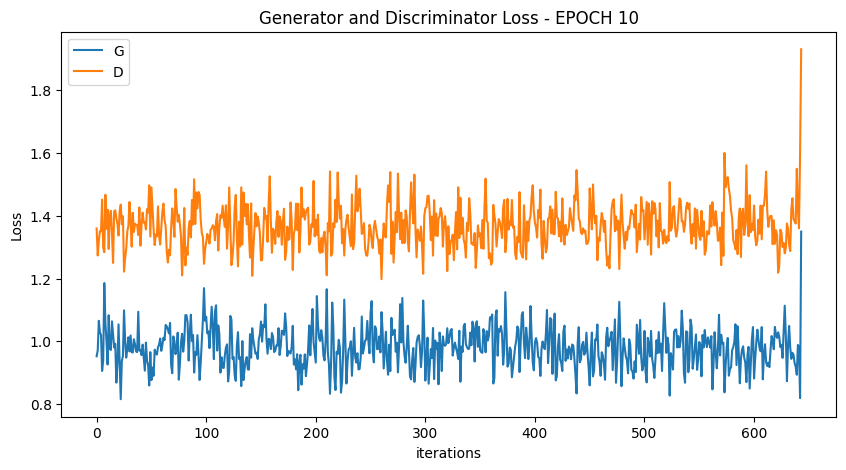

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


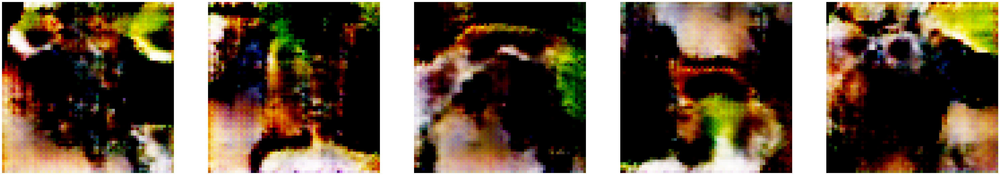

  0%|          | 0/644 [00:00<?, ?it/s]

[12/100][322/644] Loss_D: 1.3291 Loss_G: 1.0093 D(x): 0.4916 D(G(z)): 0.4449 / 0.3498
[12/100][644/644] Loss_D: 1.5014 Loss_G: 1.4449 D(x): 0.4366 D(G(z)): 0.4918 / 0.2096


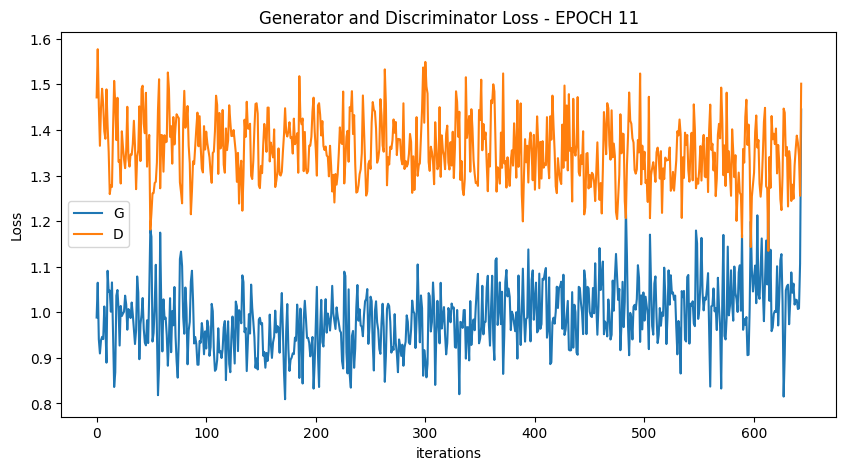

  0%|          | 0/644 [00:00<?, ?it/s]

[13/100][322/644] Loss_D: 1.2488 Loss_G: 1.0914 D(x): 0.4649 D(G(z)): 0.3695 / 0.3210
[13/100][644/644] Loss_D: 1.2127 Loss_G: 1.3592 D(x): 0.4670 D(G(z)): 0.3618 / 0.2386


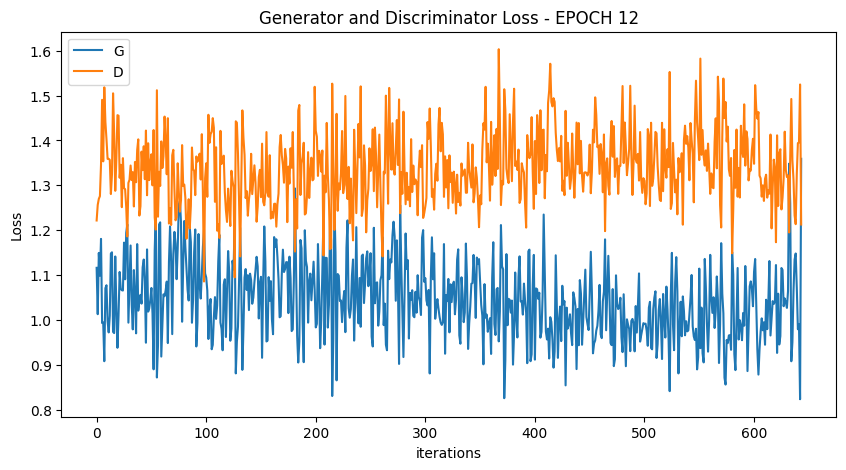

  0%|          | 0/644 [00:00<?, ?it/s]

[14/100][322/644] Loss_D: 1.2196 Loss_G: 1.0185 D(x): 0.4751 D(G(z)): 0.3695 / 0.3440
[14/100][644/644] Loss_D: 1.0606 Loss_G: 1.7695 D(x): 0.5724 D(G(z)): 0.3665 / 0.1490


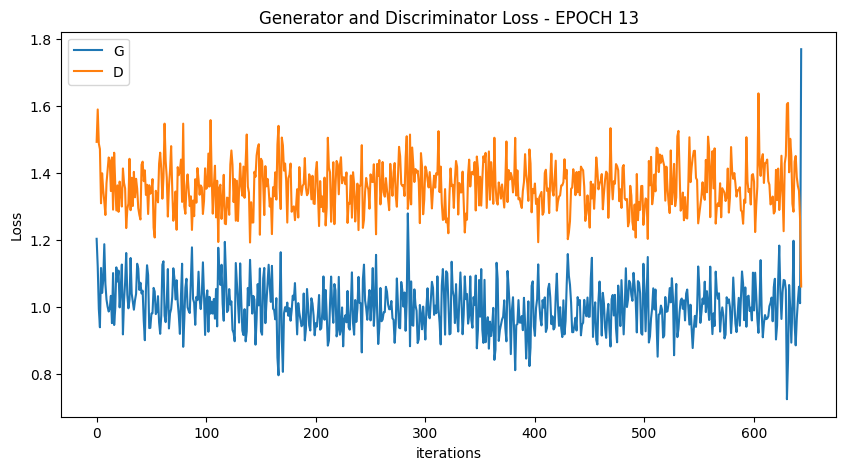

  0%|          | 0/644 [00:00<?, ?it/s]

[15/100][322/644] Loss_D: 1.3094 Loss_G: 1.0041 D(x): 0.5211 D(G(z)): 0.4645 / 0.3513
[15/100][644/644] Loss_D: 1.2465 Loss_G: 1.3807 D(x): 0.4256 D(G(z)): 0.3226 / 0.2264


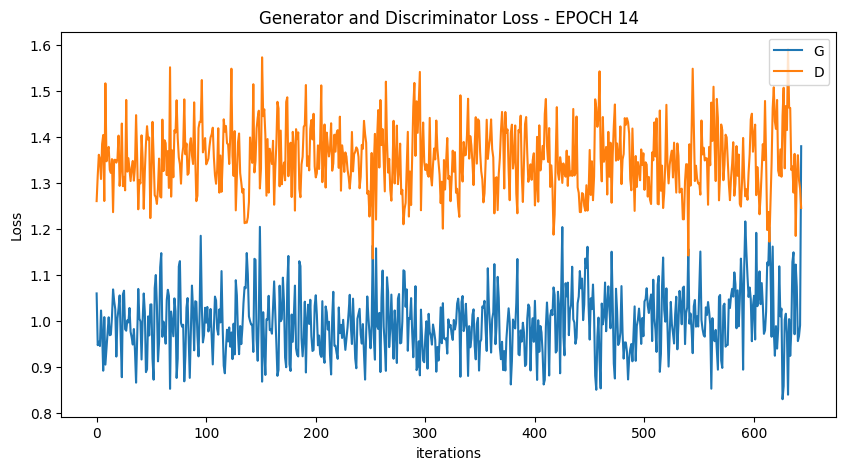

  0%|          | 0/644 [00:00<?, ?it/s]

[16/100][322/644] Loss_D: 1.4021 Loss_G: 0.9131 D(x): 0.4101 D(G(z)): 0.4047 / 0.3914
[16/100][644/644] Loss_D: 1.1028 Loss_G: 1.7761 D(x): 0.5144 D(G(z)): 0.3371 / 0.1455


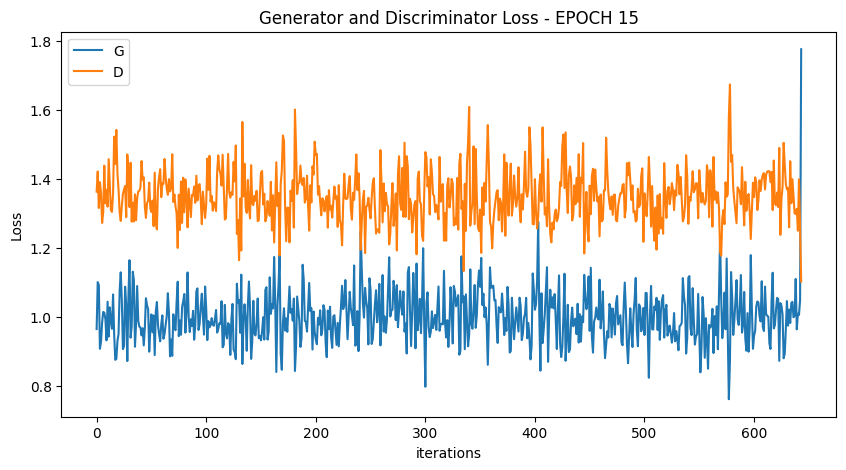

  0%|          | 0/644 [00:00<?, ?it/s]

[17/100][322/644] Loss_D: 1.3377 Loss_G: 0.9352 D(x): 0.4377 D(G(z)): 0.3849 / 0.3867
[17/100][644/644] Loss_D: 1.3147 Loss_G: 1.2331 D(x): 0.4105 D(G(z)): 0.3508 / 0.2652


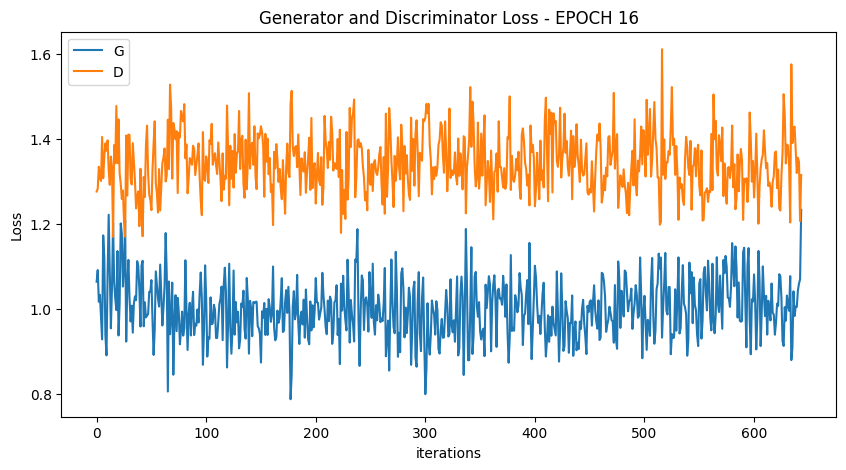

  0%|          | 0/644 [00:00<?, ?it/s]

[18/100][322/644] Loss_D: 1.2782 Loss_G: 0.9701 D(x): 0.4876 D(G(z)): 0.3973 / 0.3673
[18/100][644/644] Loss_D: 1.2662 Loss_G: 1.6857 D(x): 0.4803 D(G(z)): 0.3949 / 0.1612


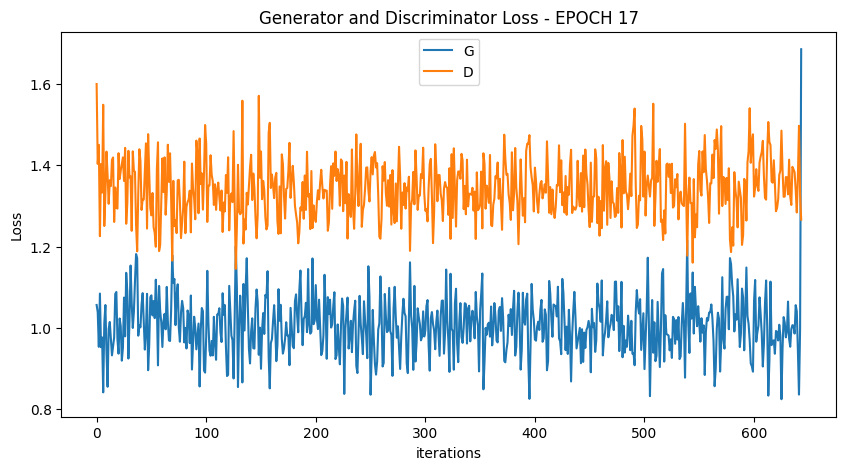

  0%|          | 0/644 [00:00<?, ?it/s]

[19/100][322/644] Loss_D: 1.3131 Loss_G: 1.1048 D(x): 0.5698 D(G(z)): 0.4938 / 0.3211
[19/100][644/644] Loss_D: 1.6650 Loss_G: 1.4155 D(x): 0.2501 D(G(z)): 0.3120 / 0.2187


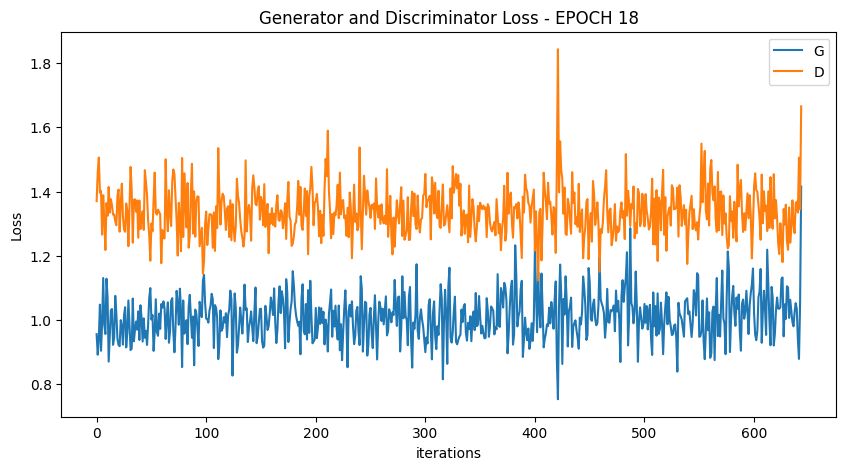

  0%|          | 0/644 [00:00<?, ?it/s]

[20/100][322/644] Loss_D: 1.4260 Loss_G: 0.8971 D(x): 0.3764 D(G(z)): 0.3686 / 0.4040
[20/100][644/644] Loss_D: 1.1299 Loss_G: 1.7564 D(x): 0.5377 D(G(z)): 0.3428 / 0.1447


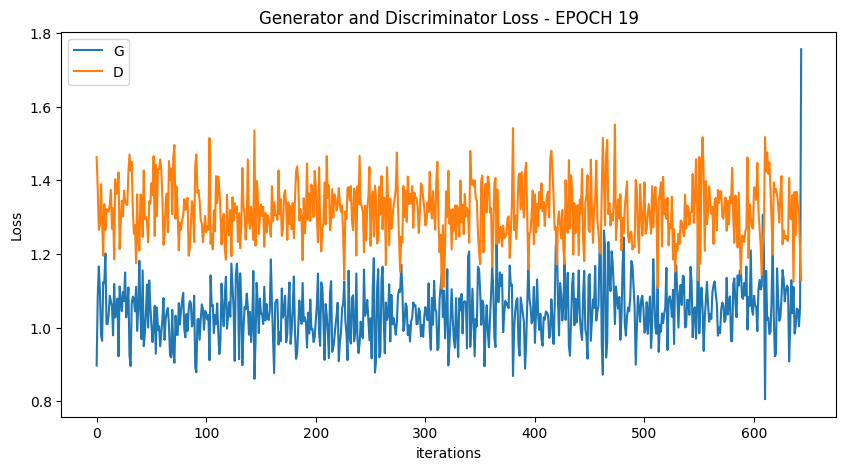

  0%|          | 0/644 [00:00<?, ?it/s]

[21/100][322/644] Loss_D: 1.4069 Loss_G: 1.1424 D(x): 0.4540 D(G(z)): 0.4353 / 0.3039
[21/100][644/644] Loss_D: 1.6225 Loss_G: 1.4540 D(x): 0.3145 D(G(z)): 0.3888 / 0.2090


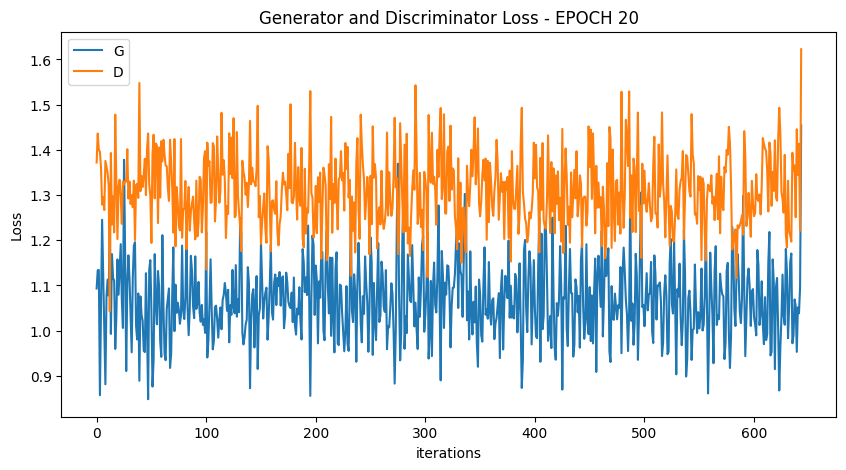

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


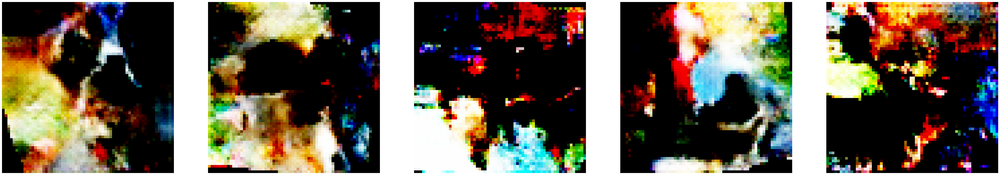

  0%|          | 0/644 [00:00<?, ?it/s]

[22/100][322/644] Loss_D: 1.2384 Loss_G: 1.2641 D(x): 0.4658 D(G(z)): 0.3621 / 0.2692
[22/100][644/644] Loss_D: 1.4378 Loss_G: 1.8672 D(x): 0.4219 D(G(z)): 0.4207 / 0.1346


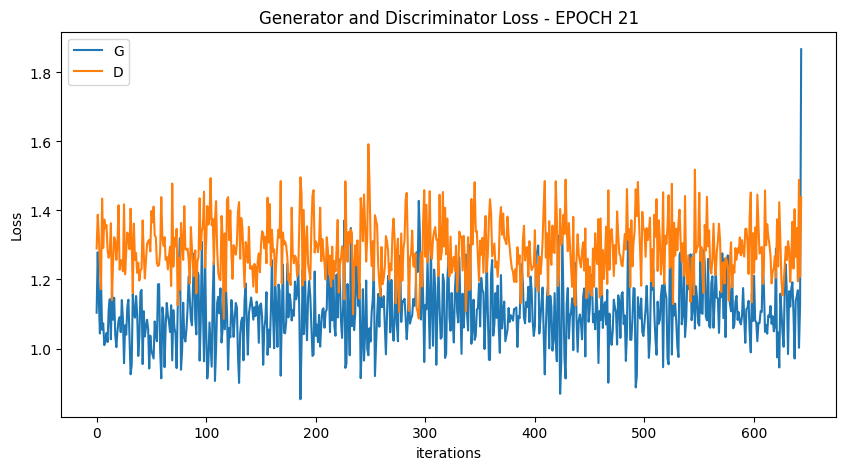

  0%|          | 0/644 [00:00<?, ?it/s]

[23/100][322/644] Loss_D: 1.2181 Loss_G: 1.1505 D(x): 0.5624 D(G(z)): 0.4272 / 0.3105
[23/100][644/644] Loss_D: 1.2134 Loss_G: 1.8710 D(x): 0.4635 D(G(z)): 0.3525 / 0.1401


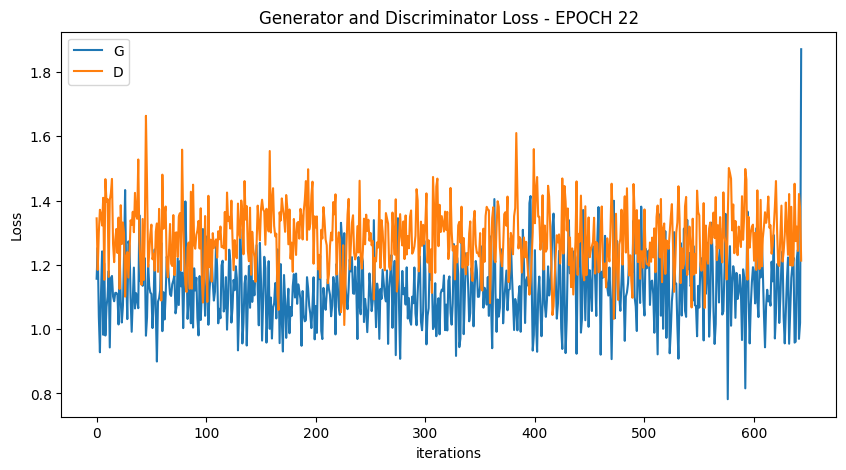

  0%|          | 0/644 [00:00<?, ?it/s]

[24/100][322/644] Loss_D: 1.3361 Loss_G: 1.1538 D(x): 0.5598 D(G(z)): 0.4875 / 0.3034
[24/100][644/644] Loss_D: 1.1525 Loss_G: 1.4500 D(x): 0.4136 D(G(z)): 0.2526 / 0.2090


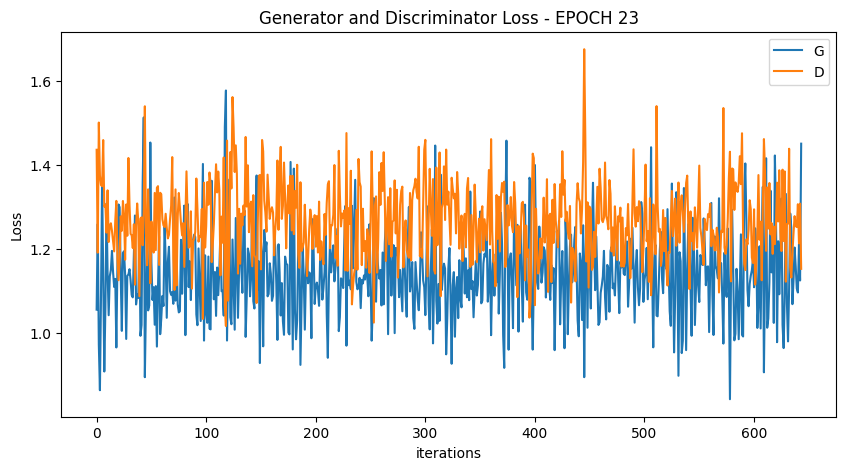

  0%|          | 0/644 [00:00<?, ?it/s]

[25/100][322/644] Loss_D: 1.2599 Loss_G: 1.1056 D(x): 0.4386 D(G(z)): 0.3164 / 0.3229
[25/100][644/644] Loss_D: 1.2068 Loss_G: 2.4744 D(x): 0.4864 D(G(z)): 0.3554 / 0.0733


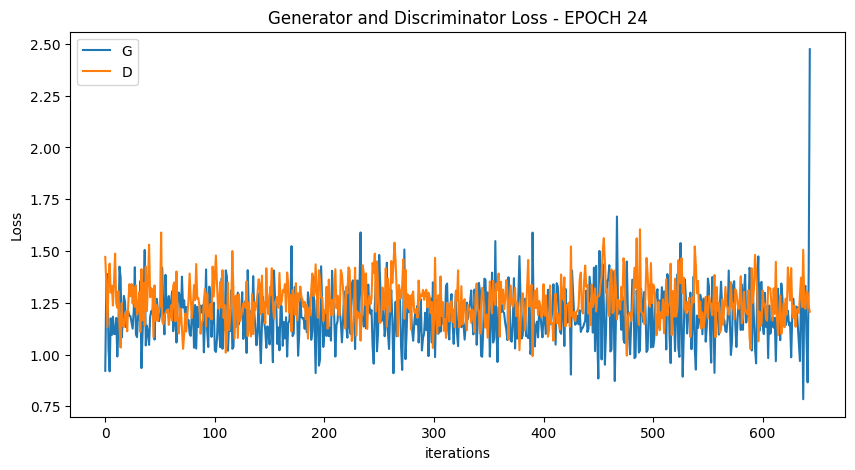

  0%|          | 0/644 [00:00<?, ?it/s]

[26/100][322/644] Loss_D: 1.3288 Loss_G: 1.1506 D(x): 0.5133 D(G(z)): 0.4494 / 0.3054
[26/100][644/644] Loss_D: 0.7454 Loss_G: 2.9816 D(x): 0.7310 D(G(z)): 0.2465 / 0.0422


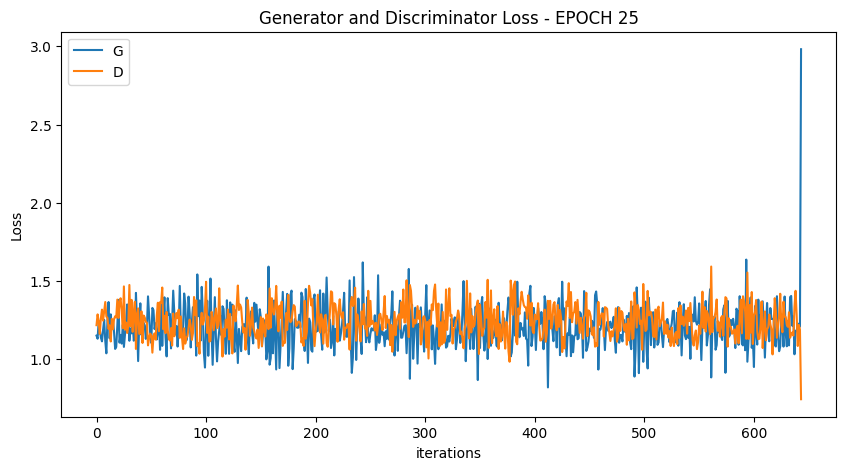

  0%|          | 0/644 [00:00<?, ?it/s]

[27/100][322/644] Loss_D: 1.1796 Loss_G: 1.2079 D(x): 0.5789 D(G(z)): 0.4177 / 0.2869
[27/100][644/644] Loss_D: 1.2970 Loss_G: 1.2048 D(x): 0.3779 D(G(z)): 0.2944 / 0.2765


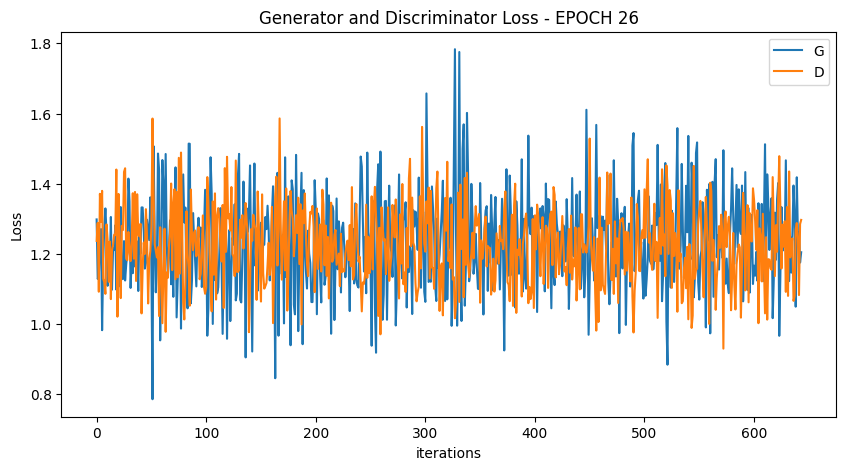

  0%|          | 0/644 [00:00<?, ?it/s]

[28/100][322/644] Loss_D: 1.2904 Loss_G: 1.1108 D(x): 0.4934 D(G(z)): 0.3906 / 0.3154
[28/100][644/644] Loss_D: 1.2329 Loss_G: 2.3236 D(x): 0.4560 D(G(z)): 0.3096 / 0.0769


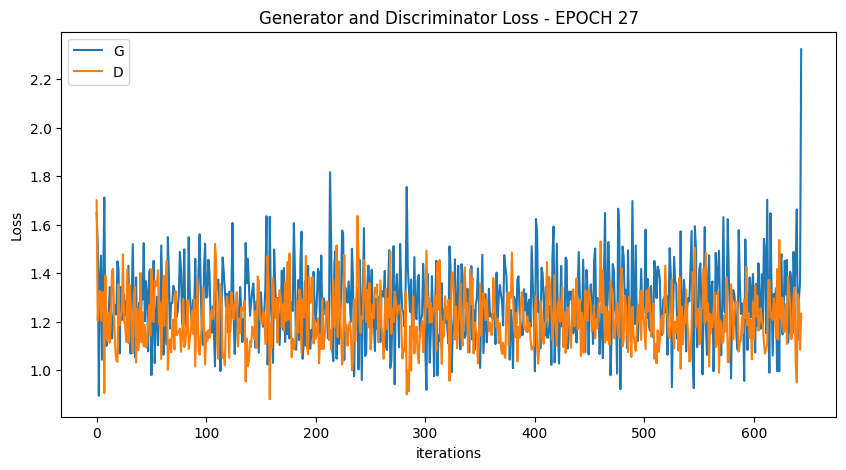

  0%|          | 0/644 [00:00<?, ?it/s]

[29/100][322/644] Loss_D: 1.0633 Loss_G: 1.3337 D(x): 0.5091 D(G(z)): 0.2663 / 0.2549
[29/100][644/644] Loss_D: 0.9871 Loss_G: 3.2921 D(x): 0.6799 D(G(z)): 0.3718 / 0.0324


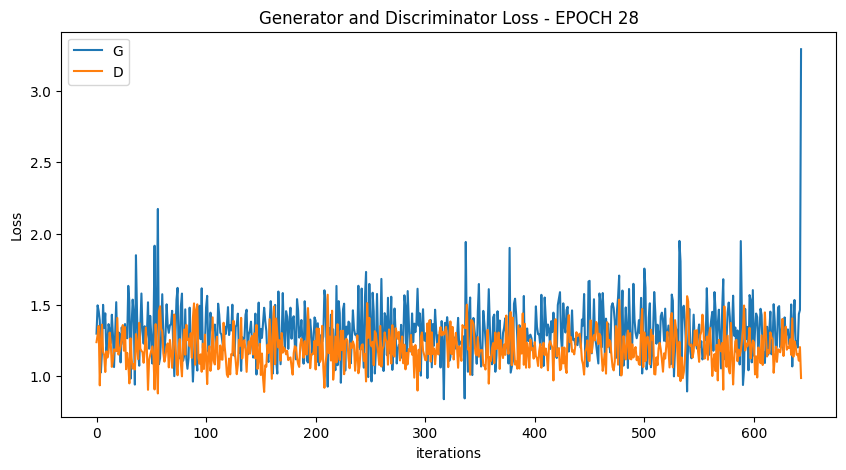

  0%|          | 0/644 [00:00<?, ?it/s]

[30/100][322/644] Loss_D: 1.2713 Loss_G: 1.1148 D(x): 0.3931 D(G(z)): 0.2321 / 0.3338
[30/100][644/644] Loss_D: 1.0325 Loss_G: 2.0370 D(x): 0.5282 D(G(z)): 0.2655 / 0.1136


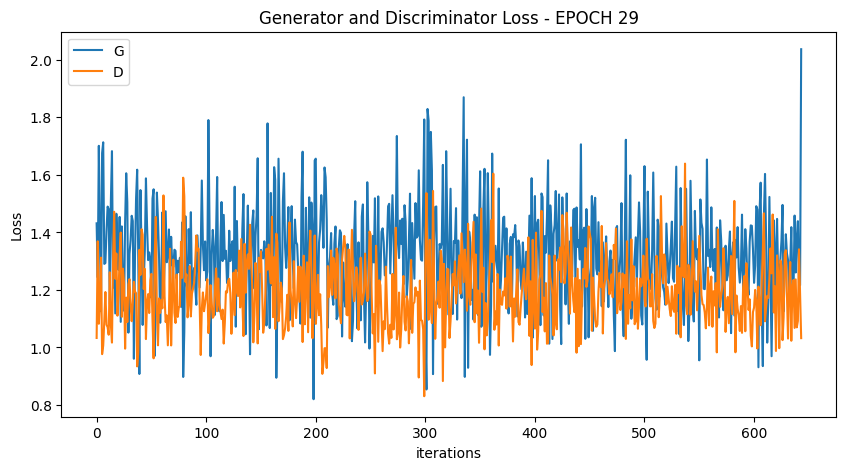

  0%|          | 0/644 [00:00<?, ?it/s]

[31/100][322/644] Loss_D: 1.2091 Loss_G: 1.2954 D(x): 0.6200 D(G(z)): 0.4474 / 0.2669
[31/100][644/644] Loss_D: 0.9991 Loss_G: 2.1023 D(x): 0.4644 D(G(z)): 0.1808 / 0.1038


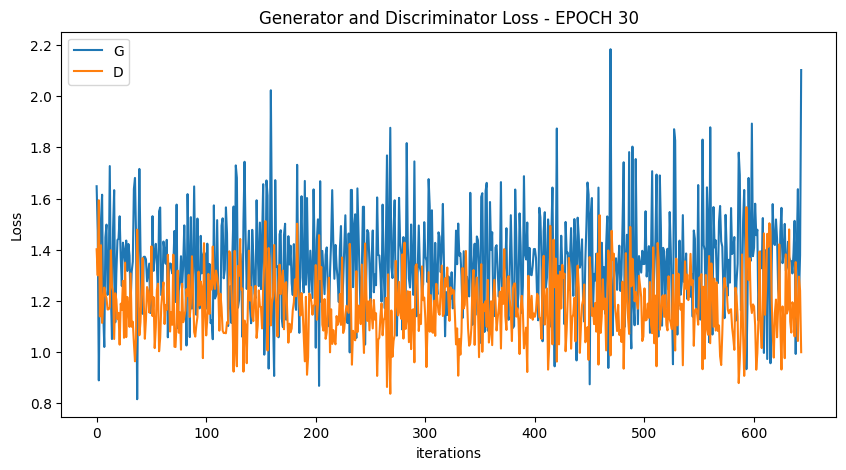

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


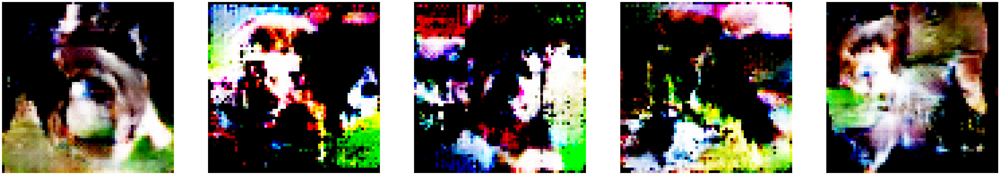

  0%|          | 0/644 [00:00<?, ?it/s]

[32/100][322/644] Loss_D: 1.1329 Loss_G: 1.3530 D(x): 0.6423 D(G(z)): 0.4206 / 0.2555
[32/100][644/644] Loss_D: 1.5608 Loss_G: 2.1265 D(x): 0.3107 D(G(z)): 0.3112 / 0.1108


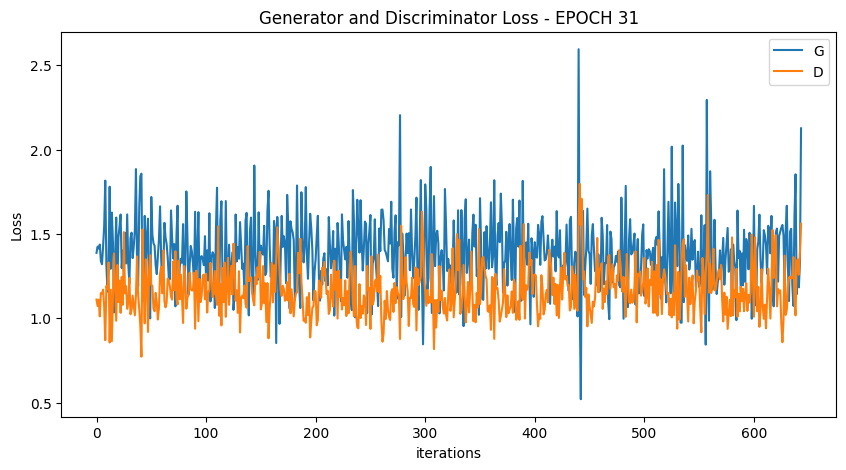

  0%|          | 0/644 [00:00<?, ?it/s]

[33/100][322/644] Loss_D: 1.2353 Loss_G: 1.2433 D(x): 0.4478 D(G(z)): 0.3125 / 0.2826
[33/100][644/644] Loss_D: 2.9354 Loss_G: 1.5848 D(x): 0.1918 D(G(z)): 0.5313 / 0.1887


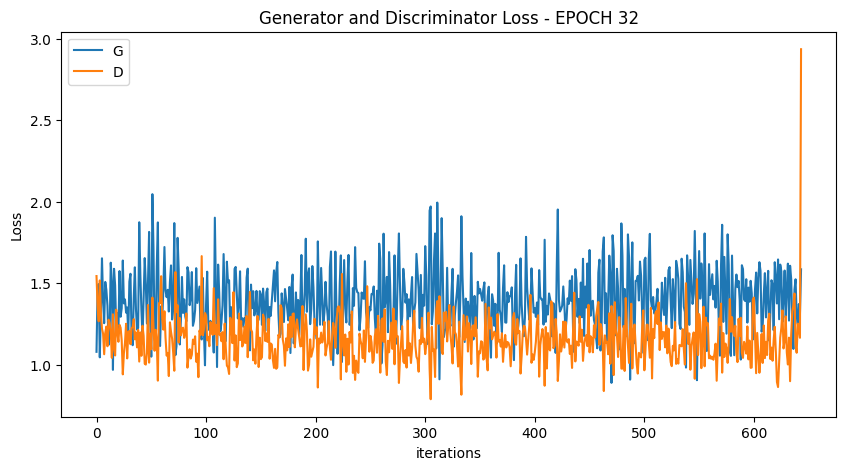

  0%|          | 0/644 [00:00<?, ?it/s]

[34/100][322/644] Loss_D: 1.1674 Loss_G: 1.5017 D(x): 0.6274 D(G(z)): 0.4244 / 0.2242
[34/100][644/644] Loss_D: 1.2788 Loss_G: 1.9992 D(x): 0.3734 D(G(z)): 0.2390 / 0.1185


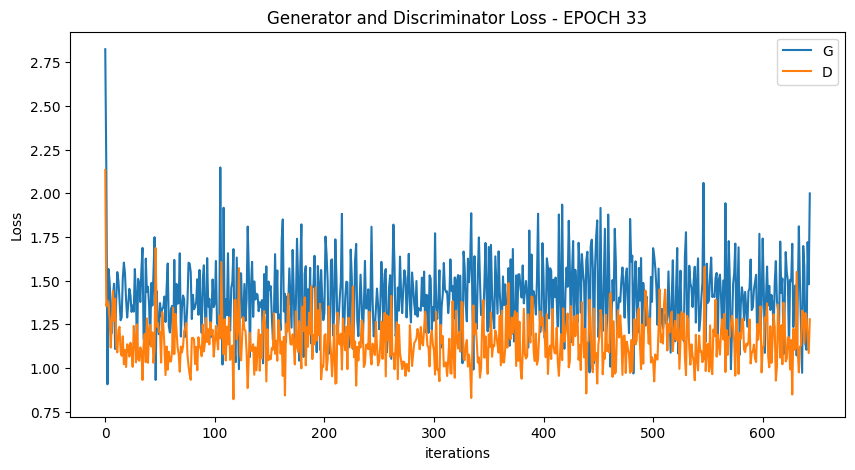

  0%|          | 0/644 [00:00<?, ?it/s]

[35/100][322/644] Loss_D: 1.1249 Loss_G: 1.7281 D(x): 0.6982 D(G(z)): 0.4365 / 0.1702
[35/100][644/644] Loss_D: 1.9092 Loss_G: 1.9154 D(x): 0.2171 D(G(z)): 0.3434 / 0.1270


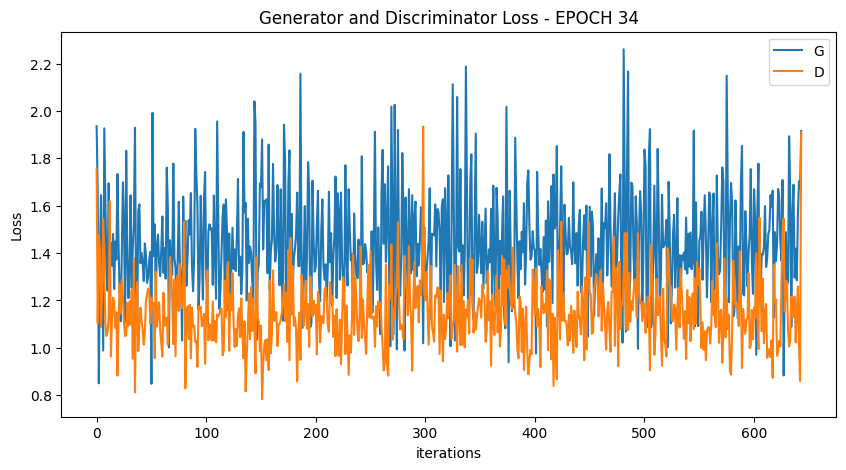

  0%|          | 0/644 [00:00<?, ?it/s]

[36/100][322/644] Loss_D: 1.0933 Loss_G: 1.4079 D(x): 0.5787 D(G(z)): 0.3562 / 0.2342
[36/100][644/644] Loss_D: 1.2355 Loss_G: 4.2904 D(x): 0.6955 D(G(z)): 0.4920 / 0.0154


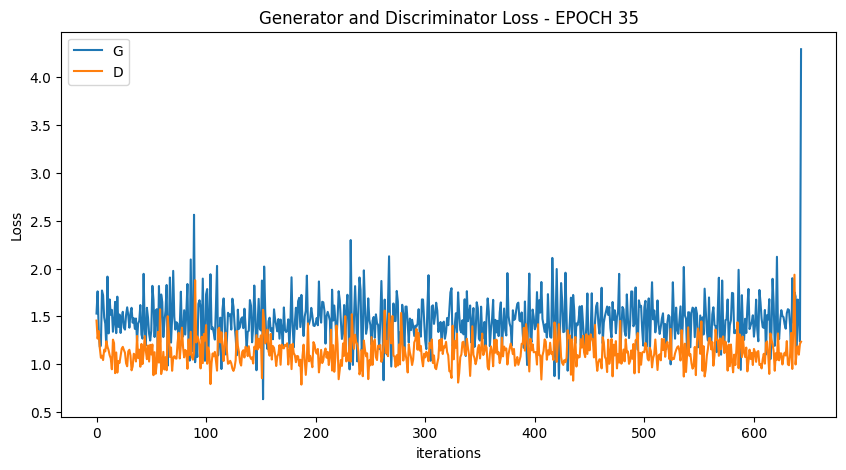

  0%|          | 0/644 [00:00<?, ?it/s]

[37/100][322/644] Loss_D: 1.0269 Loss_G: 1.8432 D(x): 0.6362 D(G(z)): 0.3547 / 0.1501
[37/100][644/644] Loss_D: 2.4023 Loss_G: 4.8671 D(x): 0.3992 D(G(z)): 0.6820 / 0.0091


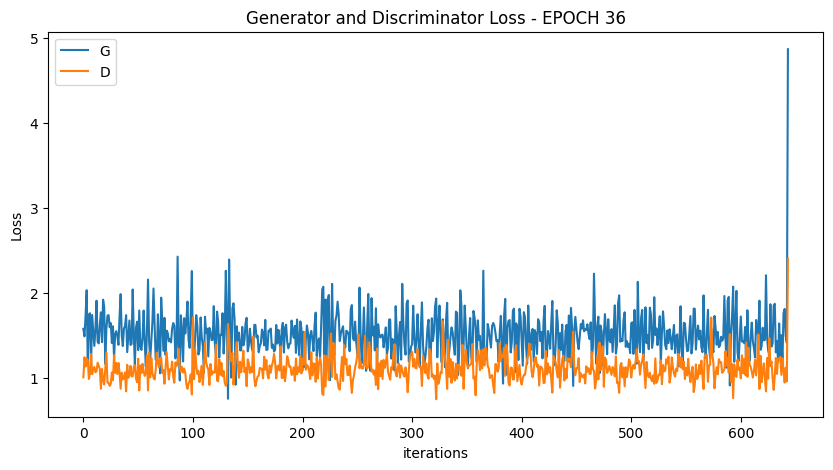

  0%|          | 0/644 [00:00<?, ?it/s]

[38/100][322/644] Loss_D: 1.1592 Loss_G: 1.6703 D(x): 0.5823 D(G(z)): 0.3516 / 0.1871
[38/100][644/644] Loss_D: 1.6113 Loss_G: 2.1658 D(x): 0.3994 D(G(z)): 0.2788 / 0.1503


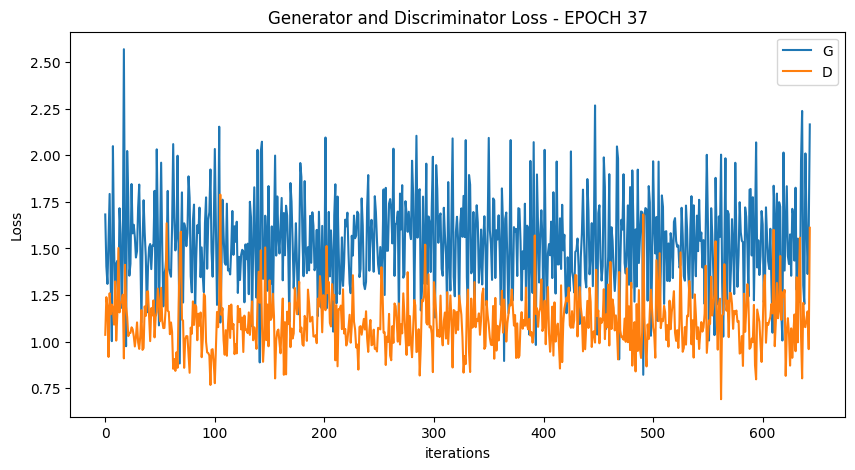

  0%|          | 0/644 [00:00<?, ?it/s]

[39/100][322/644] Loss_D: 1.1646 Loss_G: 1.5724 D(x): 0.6580 D(G(z)): 0.4391 / 0.2060
[39/100][644/644] Loss_D: 1.2644 Loss_G: 1.4921 D(x): 0.3306 D(G(z)): 0.1453 / 0.2000


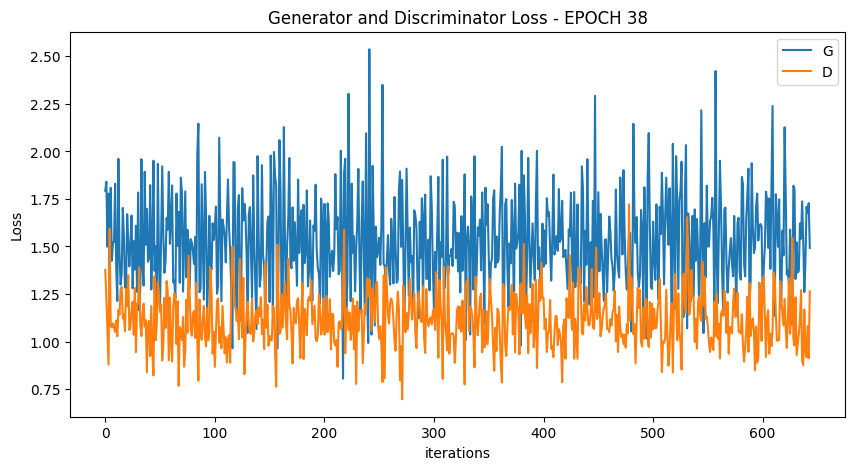

  0%|          | 0/644 [00:00<?, ?it/s]

[40/100][322/644] Loss_D: 1.1921 Loss_G: 1.2345 D(x): 0.4668 D(G(z)): 0.2674 / 0.2880
[40/100][644/644] Loss_D: 1.8156 Loss_G: 4.7676 D(x): 0.4324 D(G(z)): 0.5636 / 0.0166


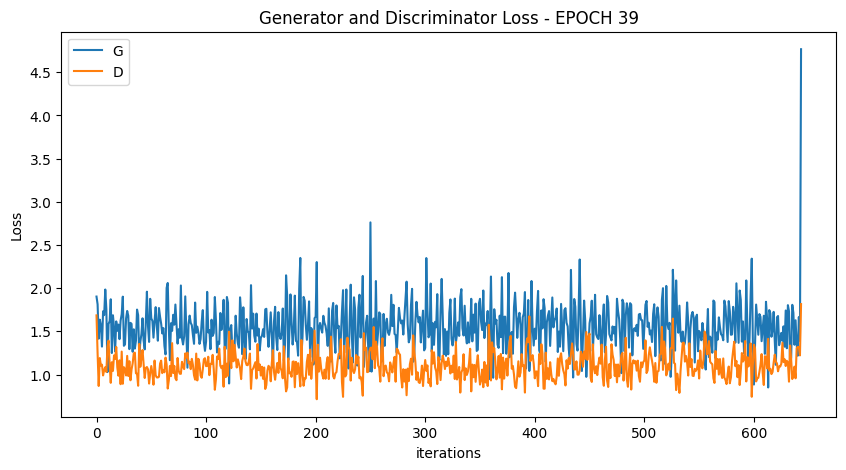

  0%|          | 0/644 [00:00<?, ?it/s]

[41/100][322/644] Loss_D: 1.0284 Loss_G: 1.8318 D(x): 0.7693 D(G(z)): 0.4188 / 0.1540
[41/100][644/644] Loss_D: 0.8475 Loss_G: 3.9752 D(x): 0.6558 D(G(z)): 0.2718 / 0.0174


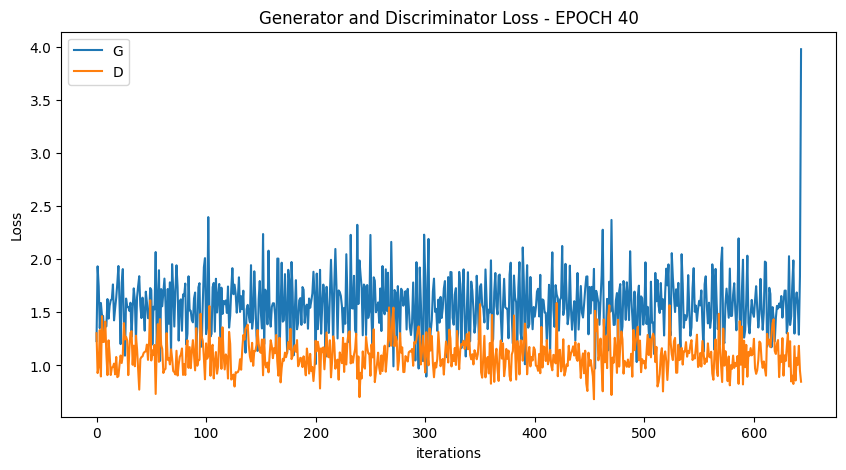

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


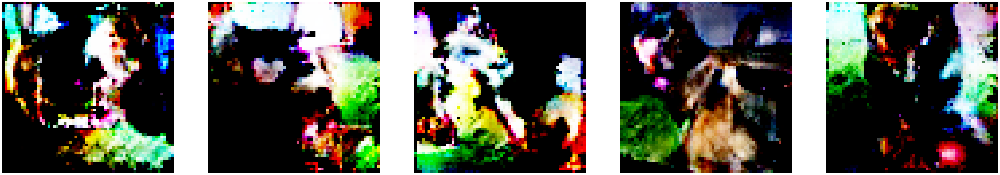

  0%|          | 0/644 [00:00<?, ?it/s]

[42/100][322/644] Loss_D: 1.2595 Loss_G: 1.6137 D(x): 0.4924 D(G(z)): 0.3199 / 0.1962
[42/100][644/644] Loss_D: 0.8432 Loss_G: 3.1182 D(x): 0.5502 D(G(z)): 0.1676 / 0.0390


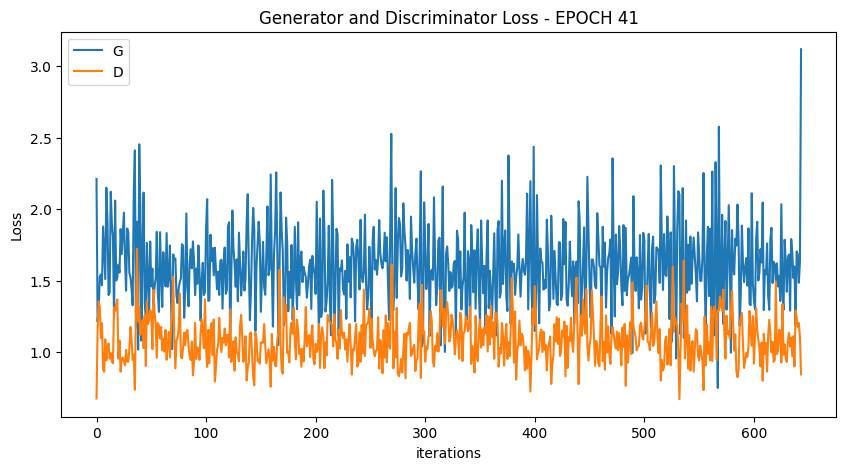

  0%|          | 0/644 [00:00<?, ?it/s]

[43/100][322/644] Loss_D: 0.8797 Loss_G: 1.8917 D(x): 0.7951 D(G(z)): 0.3515 / 0.1462
[43/100][644/644] Loss_D: 1.6304 Loss_G: 1.0781 D(x): 0.3234 D(G(z)): 0.2155 / 0.3890


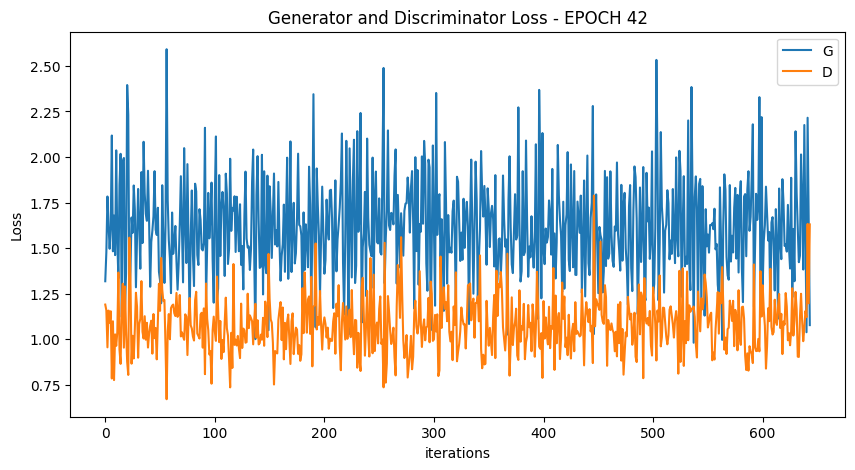

  0%|          | 0/644 [00:00<?, ?it/s]

[44/100][322/644] Loss_D: 1.0868 Loss_G: 1.9818 D(x): 0.6548 D(G(z)): 0.3676 / 0.1423
[44/100][644/644] Loss_D: 1.4318 Loss_G: 3.3215 D(x): 0.3732 D(G(z)): 0.2959 / 0.0469


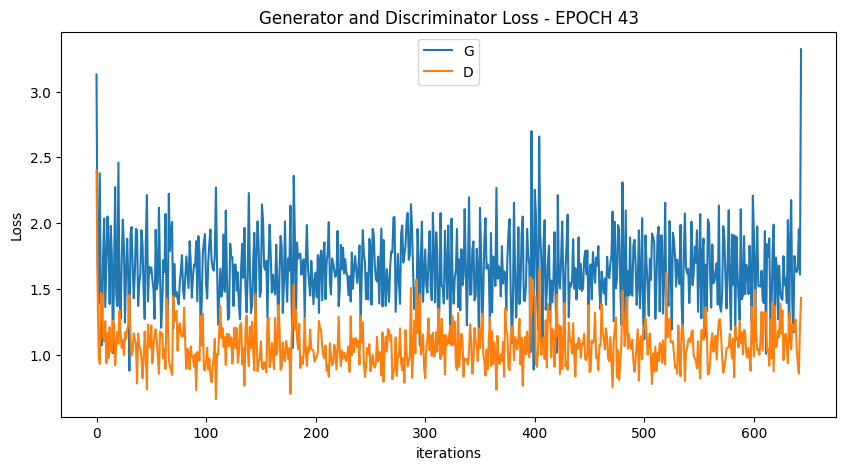

  0%|          | 0/644 [00:00<?, ?it/s]

[45/100][322/644] Loss_D: 0.7906 Loss_G: 1.5520 D(x): 0.5960 D(G(z)): 0.1720 / 0.2020
[45/100][644/644] Loss_D: 1.3161 Loss_G: 1.9582 D(x): 0.3768 D(G(z)): 0.1878 / 0.1185


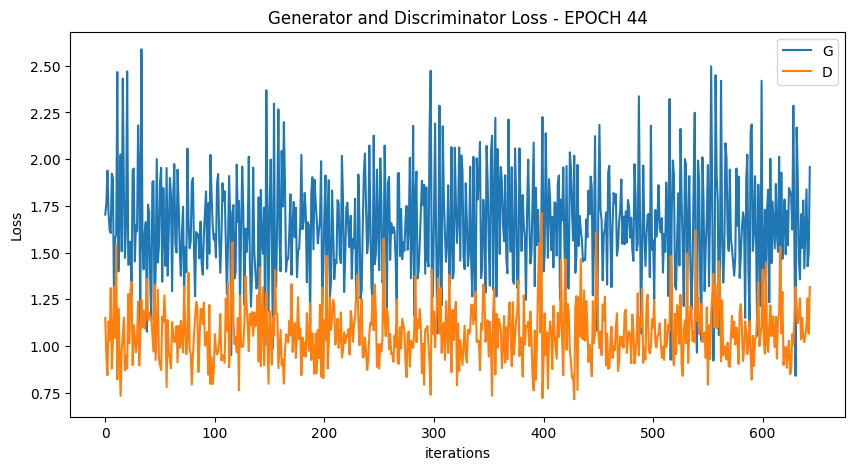

  0%|          | 0/644 [00:00<?, ?it/s]

[46/100][322/644] Loss_D: 0.9547 Loss_G: 1.7207 D(x): 0.7272 D(G(z)): 0.3440 / 0.1764
[46/100][644/644] Loss_D: 0.8284 Loss_G: 2.6152 D(x): 0.5419 D(G(z)): 0.1447 / 0.0655


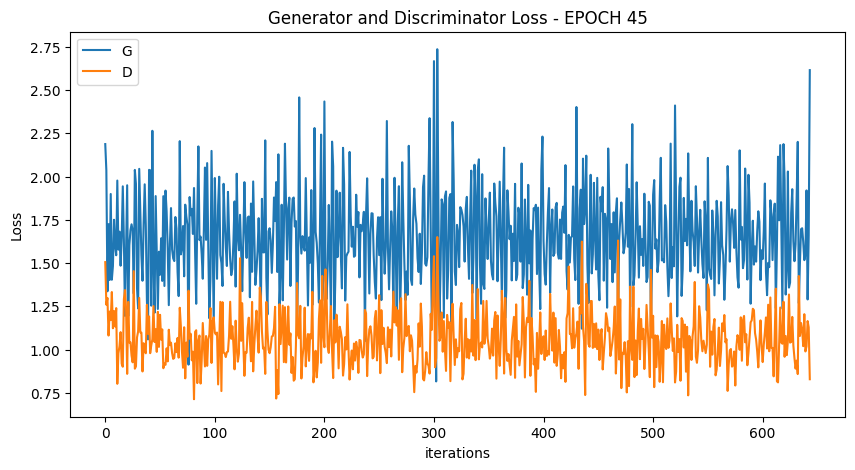

  0%|          | 0/644 [00:00<?, ?it/s]

[47/100][322/644] Loss_D: 1.0460 Loss_G: 1.6077 D(x): 0.5901 D(G(z)): 0.3090 / 0.2061
[47/100][644/644] Loss_D: 0.6513 Loss_G: 2.9489 D(x): 0.6377 D(G(z)): 0.1277 / 0.0398


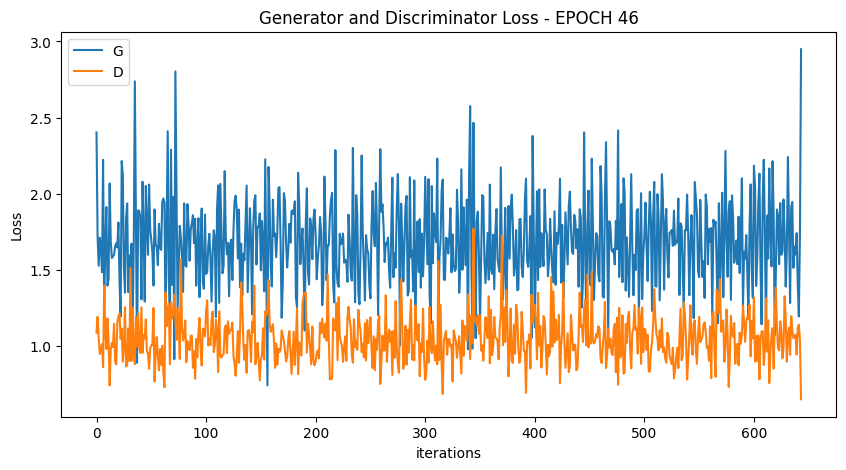

  0%|          | 0/644 [00:00<?, ?it/s]

[48/100][322/644] Loss_D: 1.1309 Loss_G: 2.0945 D(x): 0.6980 D(G(z)): 0.4024 / 0.1272
[48/100][644/644] Loss_D: 1.3435 Loss_G: 1.9630 D(x): 0.3316 D(G(z)): 0.2570 / 0.1227


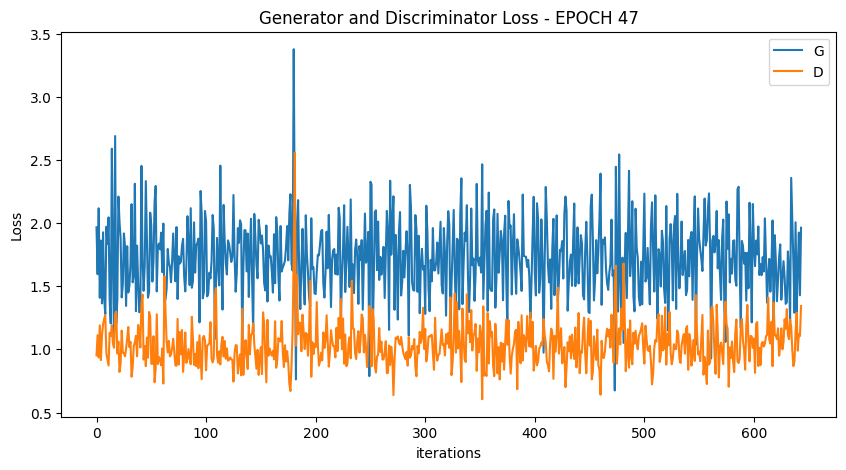

  0%|          | 0/644 [00:00<?, ?it/s]

[49/100][322/644] Loss_D: 1.1236 Loss_G: 1.5445 D(x): 0.4870 D(G(z)): 0.2251 / 0.2030
[49/100][644/644] Loss_D: 0.8151 Loss_G: 3.2168 D(x): 0.6710 D(G(z)): 0.2085 / 0.0313


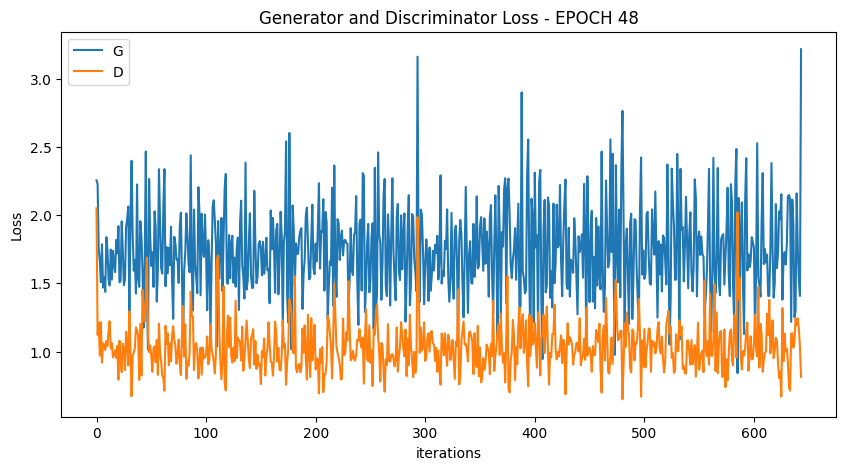

  0%|          | 0/644 [00:00<?, ?it/s]

[50/100][322/644] Loss_D: 1.3067 Loss_G: 1.3394 D(x): 0.4544 D(G(z)): 0.3275 / 0.2614
[50/100][644/644] Loss_D: 1.2439 Loss_G: 1.9863 D(x): 0.4386 D(G(z)): 0.1770 / 0.1202


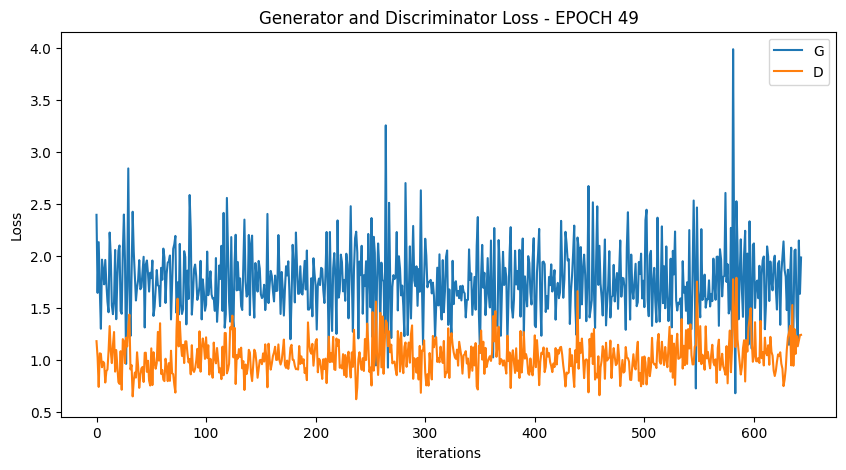

  0%|          | 0/644 [00:00<?, ?it/s]

[51/100][322/644] Loss_D: 0.9938 Loss_G: 1.6205 D(x): 0.5933 D(G(z)): 0.2785 / 0.1931
[51/100][644/644] Loss_D: 0.8383 Loss_G: 3.2862 D(x): 0.6219 D(G(z)): 0.1652 / 0.0289


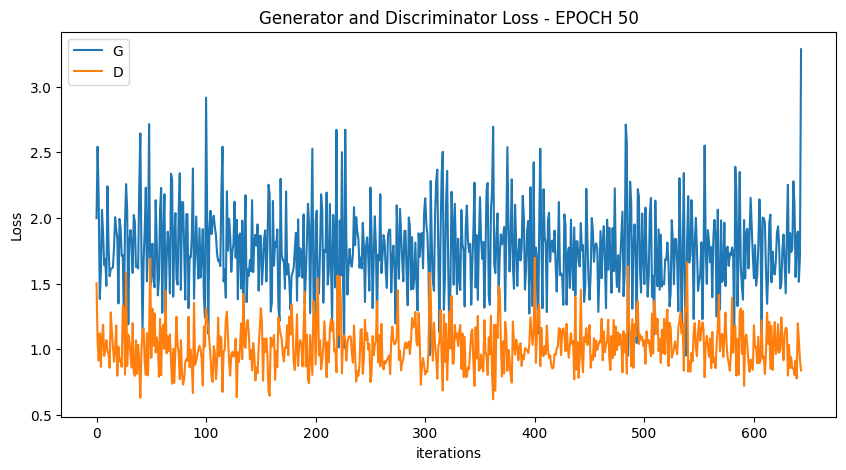

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


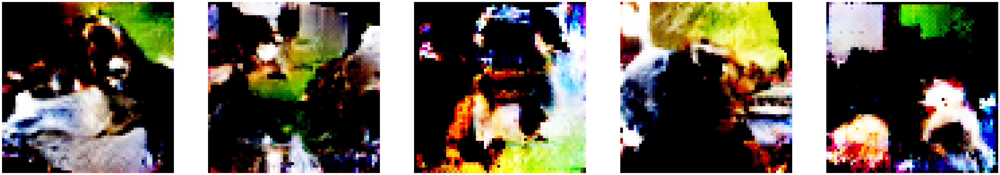

  0%|          | 0/644 [00:00<?, ?it/s]

[52/100][322/644] Loss_D: 1.2512 Loss_G: 1.5573 D(x): 0.5422 D(G(z)): 0.3746 / 0.2066
[52/100][644/644] Loss_D: 0.6957 Loss_G: 3.2050 D(x): 0.7239 D(G(z)): 0.1890 / 0.0310


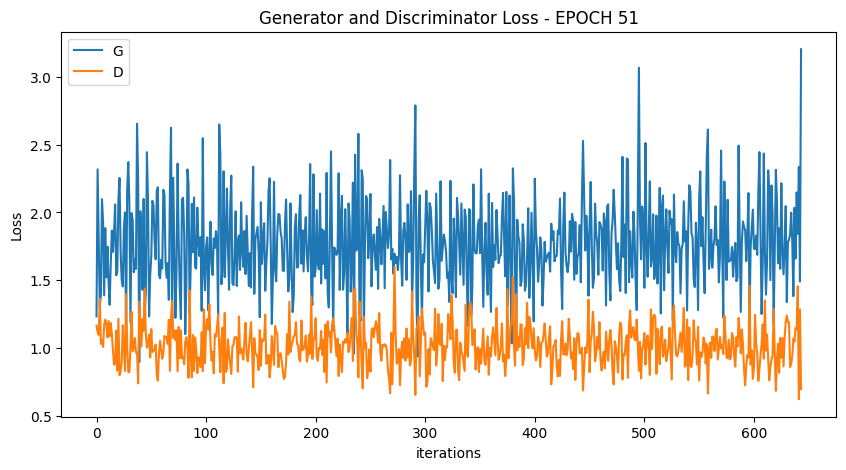

  0%|          | 0/644 [00:00<?, ?it/s]

[53/100][322/644] Loss_D: 0.7460 Loss_G: 2.2520 D(x): 0.7039 D(G(z)): 0.2006 / 0.1075
[53/100][644/644] Loss_D: 1.1042 Loss_G: 3.0179 D(x): 0.3264 D(G(z)): 0.0362 / 0.0569


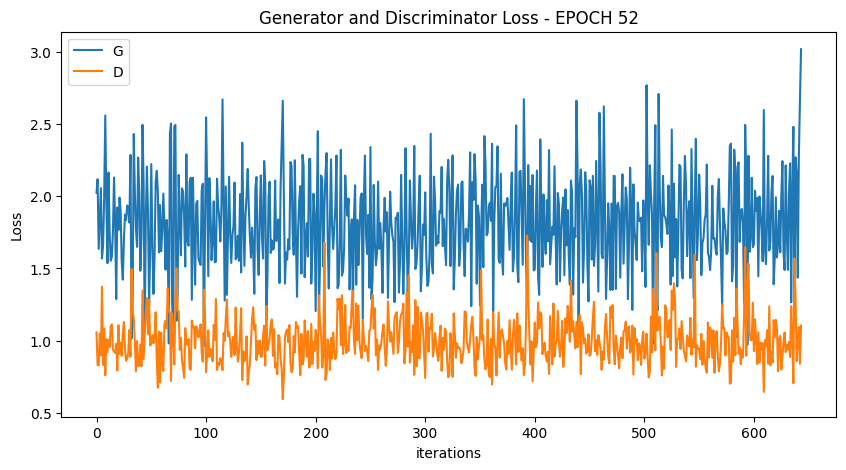

  0%|          | 0/644 [00:00<?, ?it/s]

[54/100][322/644] Loss_D: 1.1956 Loss_G: 2.0710 D(x): 0.6958 D(G(z)): 0.4321 / 0.1283
[54/100][644/644] Loss_D: 1.6962 Loss_G: 2.4791 D(x): 0.3130 D(G(z)): 0.3963 / 0.0678


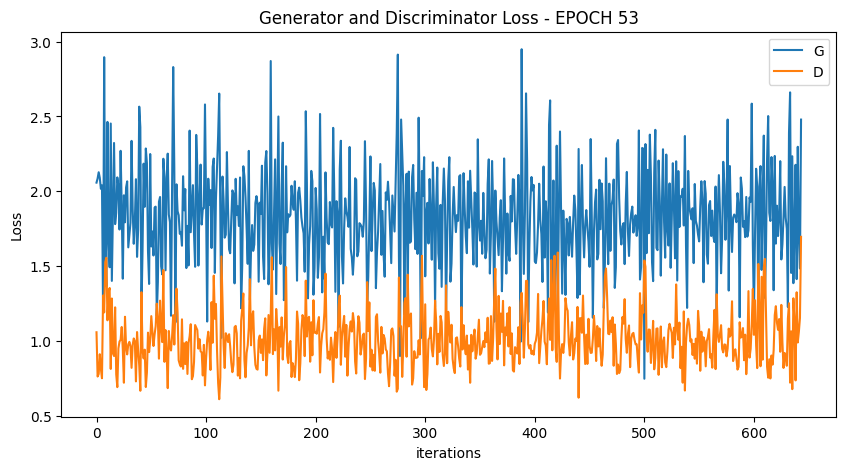

  0%|          | 0/644 [00:00<?, ?it/s]

[55/100][322/644] Loss_D: 1.0564 Loss_G: 1.4596 D(x): 0.5900 D(G(z)): 0.3355 / 0.2268
[55/100][644/644] Loss_D: 1.2695 Loss_G: 2.3710 D(x): 0.4148 D(G(z)): 0.0768 / 0.0885


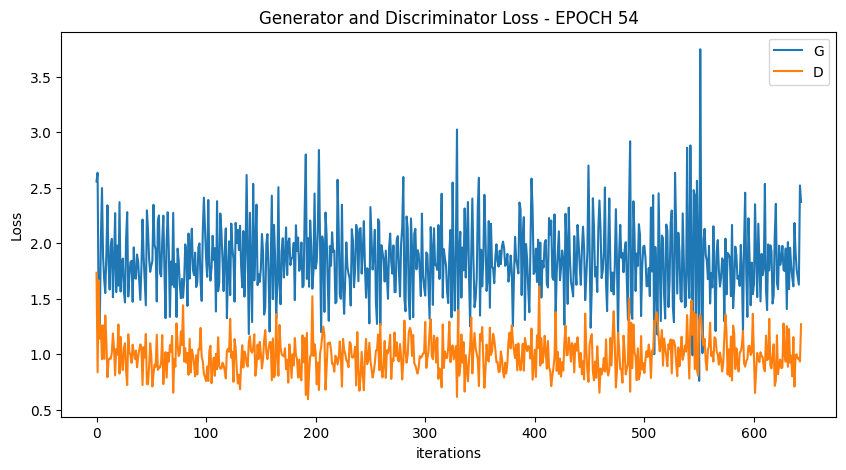

  0%|          | 0/644 [00:00<?, ?it/s]

[56/100][322/644] Loss_D: 0.8216 Loss_G: 2.1360 D(x): 0.8415 D(G(z)): 0.3387 / 0.1126
[56/100][644/644] Loss_D: 1.2269 Loss_G: 1.8008 D(x): 0.3250 D(G(z)): 0.0680 / 0.1636


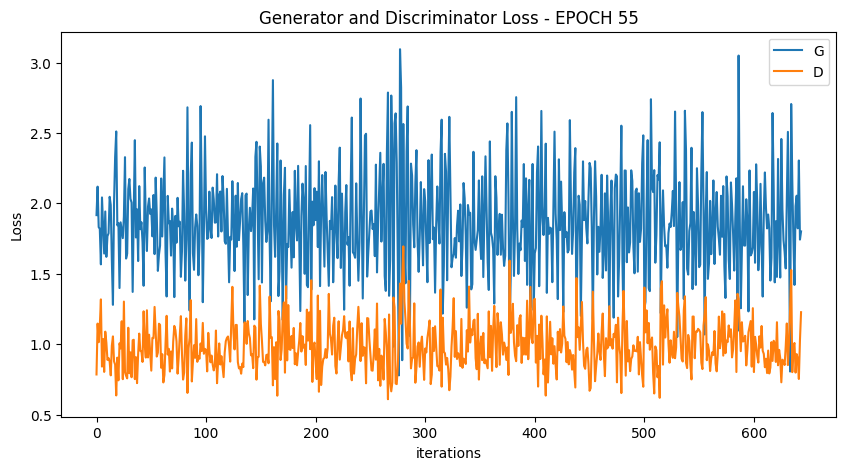

  0%|          | 0/644 [00:00<?, ?it/s]

[57/100][322/644] Loss_D: 0.8763 Loss_G: 1.7788 D(x): 0.6144 D(G(z)): 0.2255 / 0.1698
[57/100][644/644] Loss_D: 1.2364 Loss_G: 2.4579 D(x): 0.4264 D(G(z)): 0.0586 / 0.0680


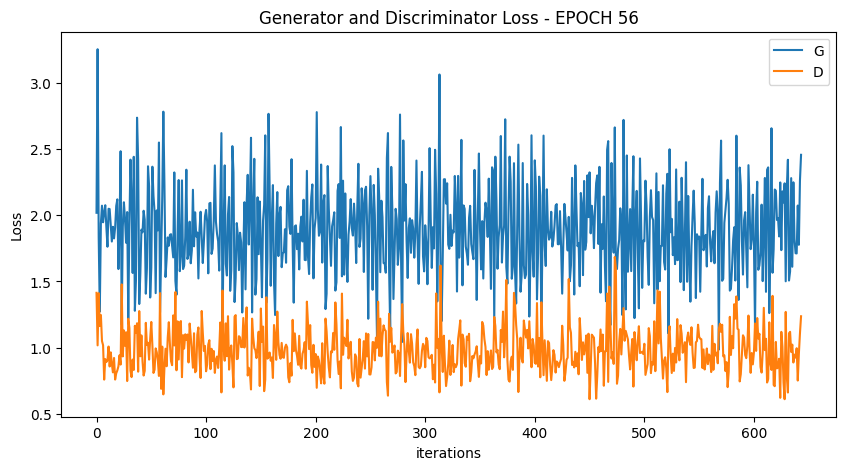

  0%|          | 0/644 [00:00<?, ?it/s]

[58/100][322/644] Loss_D: 0.9869 Loss_G: 1.9496 D(x): 0.7029 D(G(z)): 0.3610 / 0.1363
[58/100][644/644] Loss_D: 1.5109 Loss_G: 1.9680 D(x): 0.2693 D(G(z)): 0.2074 / 0.1352


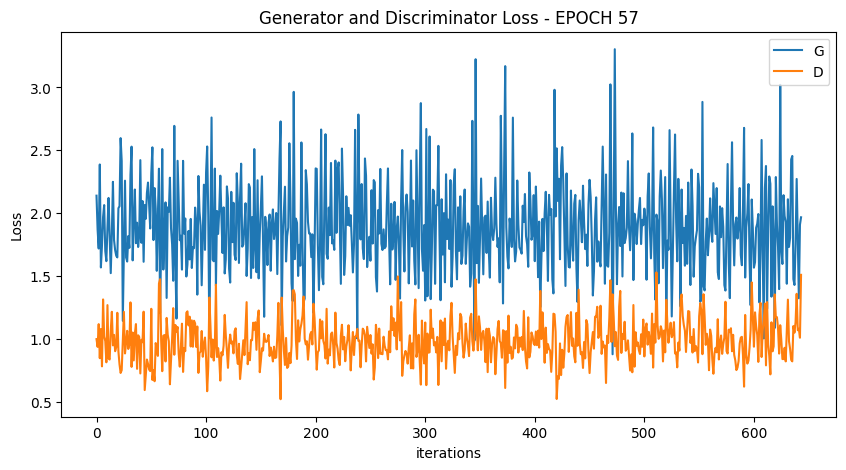

  0%|          | 0/644 [00:00<?, ?it/s]

[59/100][322/644] Loss_D: 1.1414 Loss_G: 2.7480 D(x): 0.7588 D(G(z)): 0.4361 / 0.0646
[59/100][644/644] Loss_D: 0.6797 Loss_G: 3.2809 D(x): 0.6509 D(G(z)): 0.1323 / 0.0263


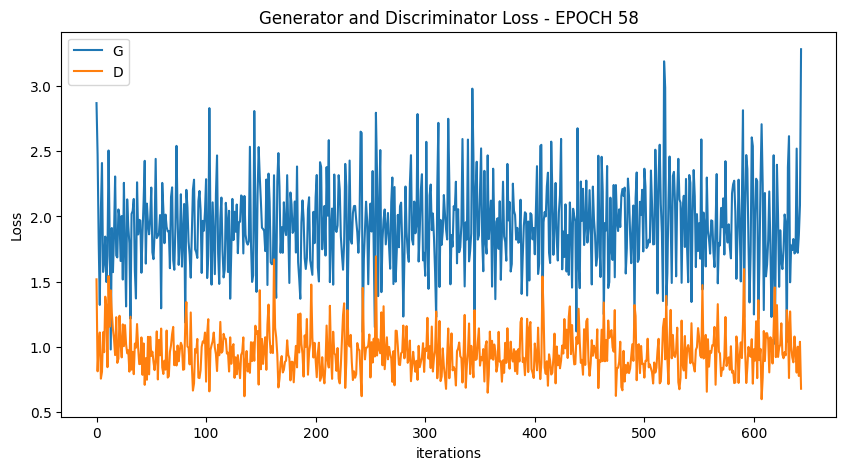

  0%|          | 0/644 [00:00<?, ?it/s]

[60/100][322/644] Loss_D: 0.9464 Loss_G: 2.4950 D(x): 0.5239 D(G(z)): 0.1455 / 0.0898
[60/100][644/644] Loss_D: 1.2292 Loss_G: 4.3245 D(x): 0.5395 D(G(z)): 0.2582 / 0.0188


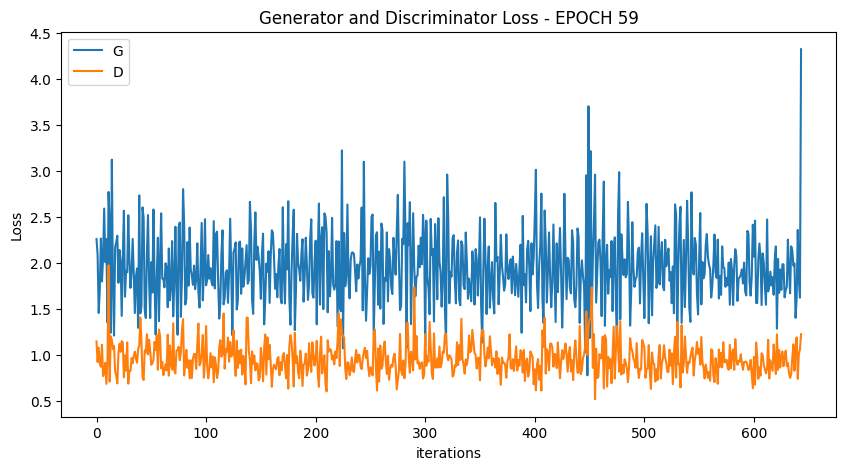

  0%|          | 0/644 [00:00<?, ?it/s]

[61/100][322/644] Loss_D: 1.0168 Loss_G: 1.3631 D(x): 0.4357 D(G(z)): 0.0996 / 0.2780
[61/100][644/644] Loss_D: 0.7621 Loss_G: 3.2153 D(x): 0.6396 D(G(z)): 0.1084 / 0.0323


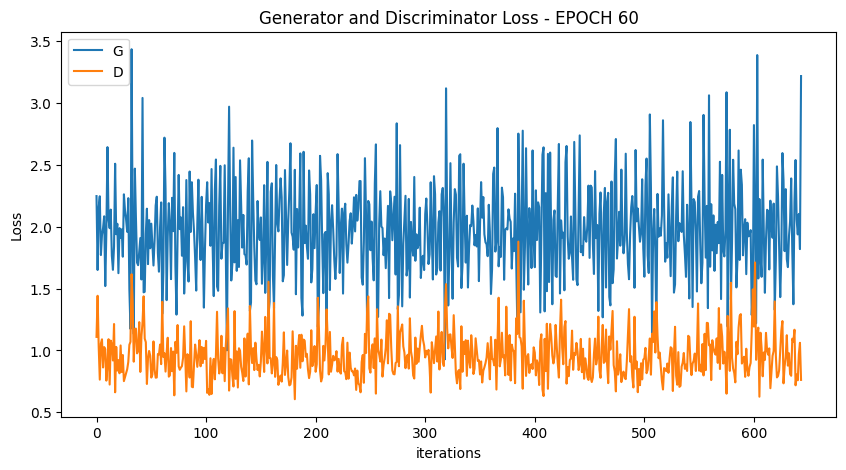

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


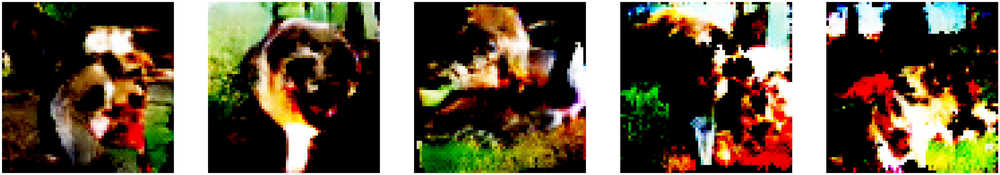

  0%|          | 0/644 [00:00<?, ?it/s]

[62/100][322/644] Loss_D: 1.0313 Loss_G: 2.2816 D(x): 0.6834 D(G(z)): 0.3624 / 0.1073
[62/100][644/644] Loss_D: 1.3303 Loss_G: 3.2351 D(x): 0.4230 D(G(z)): 0.1856 / 0.0471


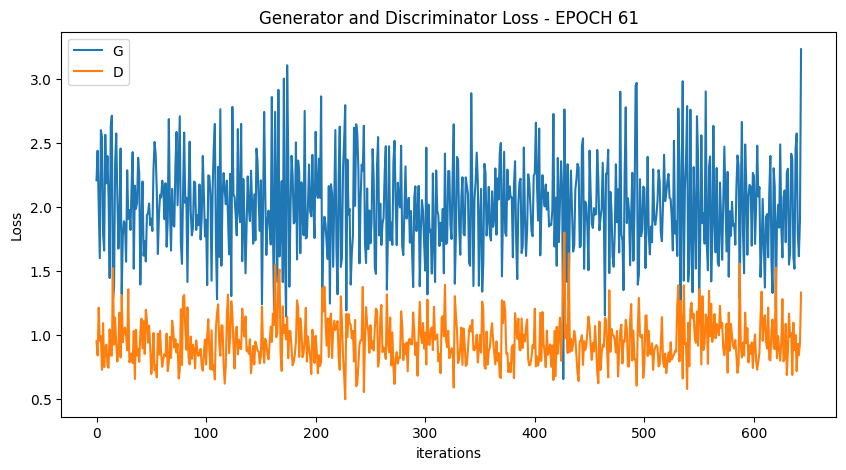

  0%|          | 0/644 [00:00<?, ?it/s]

[63/100][322/644] Loss_D: 0.7851 Loss_G: 1.7797 D(x): 0.6416 D(G(z)): 0.1821 / 0.1614
[63/100][644/644] Loss_D: 0.8777 Loss_G: 2.0785 D(x): 0.4962 D(G(z)): 0.1019 / 0.1128


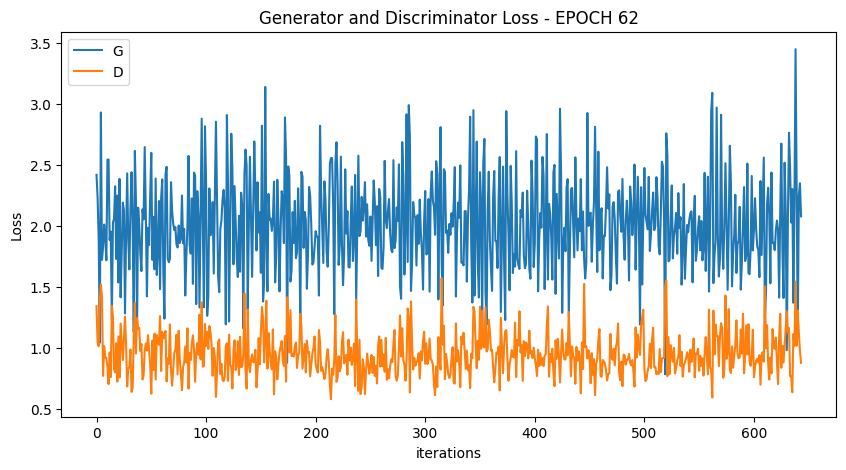

  0%|          | 0/644 [00:00<?, ?it/s]

[64/100][322/644] Loss_D: 0.9447 Loss_G: 2.0267 D(x): 0.6492 D(G(z)): 0.2787 / 0.1311
[64/100][644/644] Loss_D: 0.8414 Loss_G: 4.0975 D(x): 0.6669 D(G(z)): 0.2509 / 0.0116


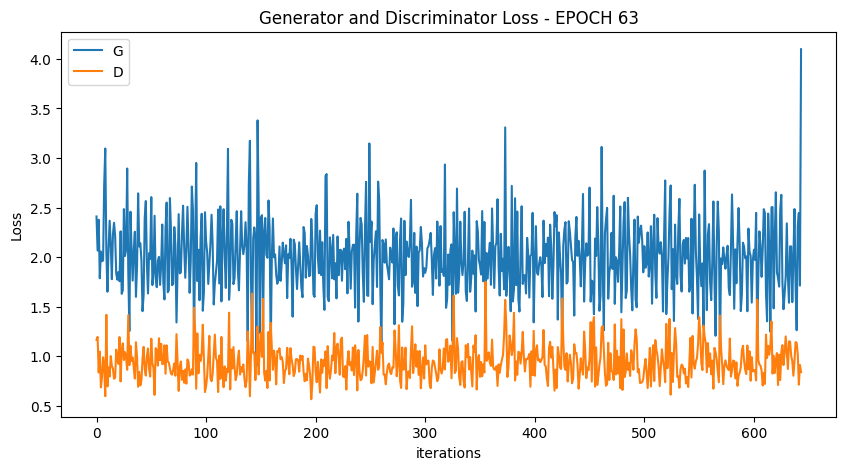

  0%|          | 0/644 [00:00<?, ?it/s]

[65/100][322/644] Loss_D: 0.9070 Loss_G: 1.6646 D(x): 0.5199 D(G(z)): 0.1106 / 0.1921
[65/100][644/644] Loss_D: 1.1997 Loss_G: 1.7068 D(x): 0.3105 D(G(z)): 0.0606 / 0.1657


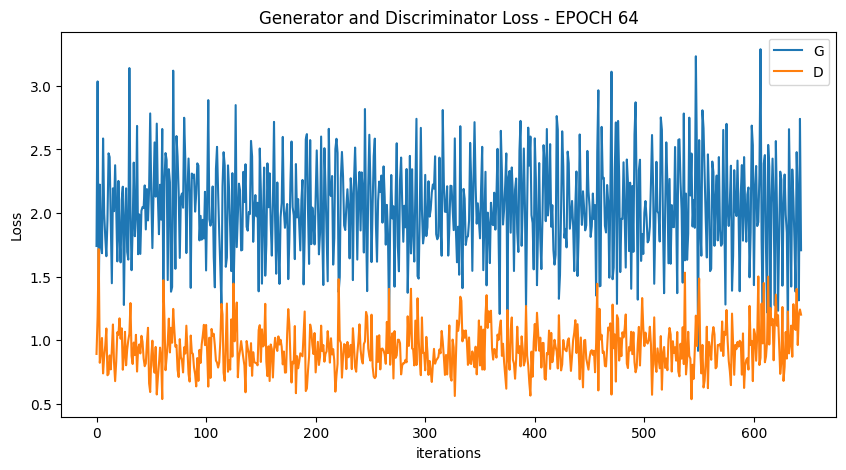

  0%|          | 0/644 [00:00<?, ?it/s]

[66/100][322/644] Loss_D: 0.9672 Loss_G: 1.4972 D(x): 0.4929 D(G(z)): 0.1365 / 0.2310
[66/100][644/644] Loss_D: 1.0345 Loss_G: 6.4339 D(x): 0.8019 D(G(z)): 0.3713 / 0.0020


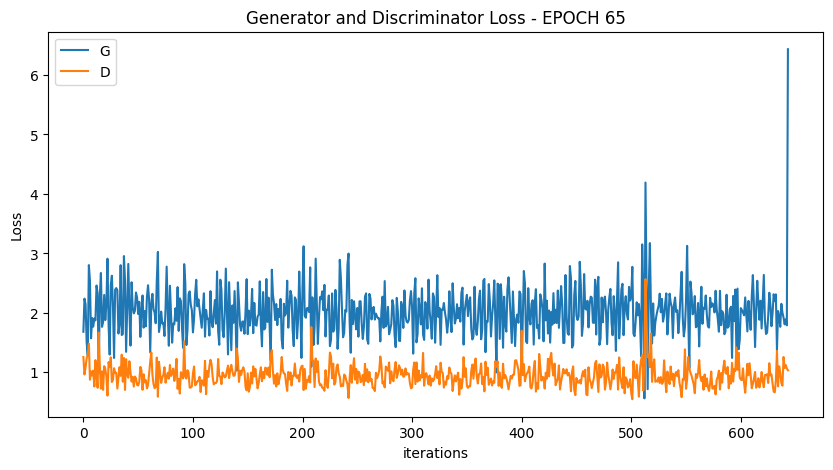

  0%|          | 0/644 [00:00<?, ?it/s]

[67/100][322/644] Loss_D: 0.8498 Loss_G: 2.1407 D(x): 0.7907 D(G(z)): 0.3061 / 0.1157
[67/100][644/644] Loss_D: 1.3239 Loss_G: 4.9573 D(x): 0.4670 D(G(z)): 0.3436 / 0.0131


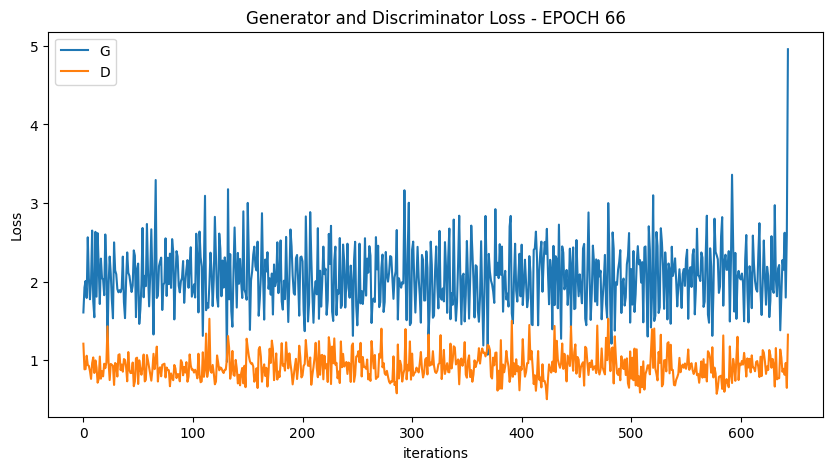

  0%|          | 0/644 [00:00<?, ?it/s]

[68/100][322/644] Loss_D: 0.9121 Loss_G: 1.9278 D(x): 0.6181 D(G(z)): 0.2215 / 0.1674
[68/100][644/644] Loss_D: 0.8593 Loss_G: 3.2884 D(x): 0.5402 D(G(z)): 0.0617 / 0.0305


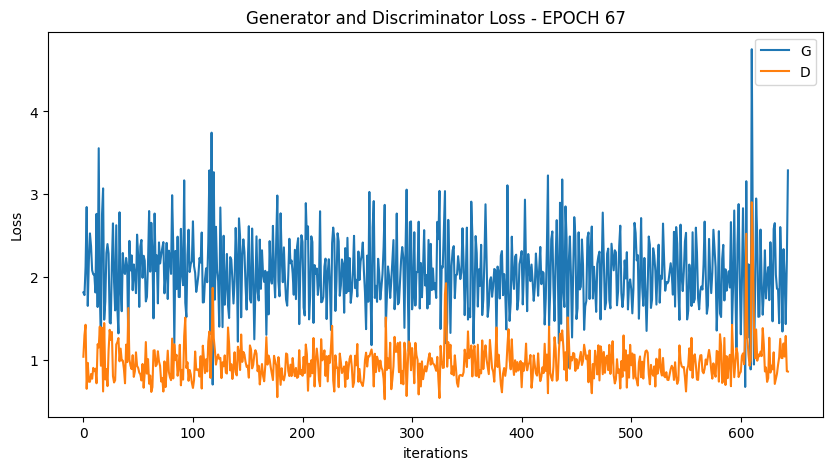

  0%|          | 0/644 [00:00<?, ?it/s]

[69/100][322/644] Loss_D: 1.1298 Loss_G: 1.8590 D(x): 0.5681 D(G(z)): 0.3229 / 0.1592
[69/100][644/644] Loss_D: 1.0517 Loss_G: 3.0024 D(x): 0.5848 D(G(z)): 0.1577 / 0.0408


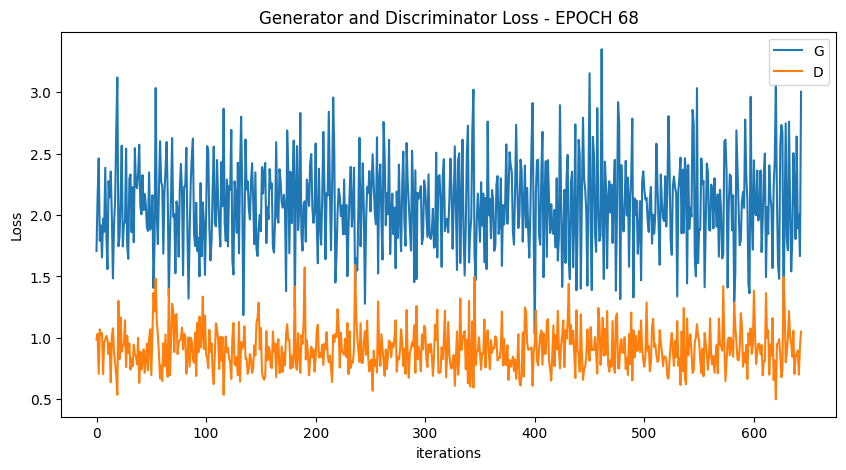

  0%|          | 0/644 [00:00<?, ?it/s]

[70/100][322/644] Loss_D: 0.8397 Loss_G: 2.1035 D(x): 0.6299 D(G(z)): 0.2065 / 0.1321
[70/100][644/644] Loss_D: 1.8612 Loss_G: 1.5409 D(x): 0.1775 D(G(z)): 0.1475 / 0.2092


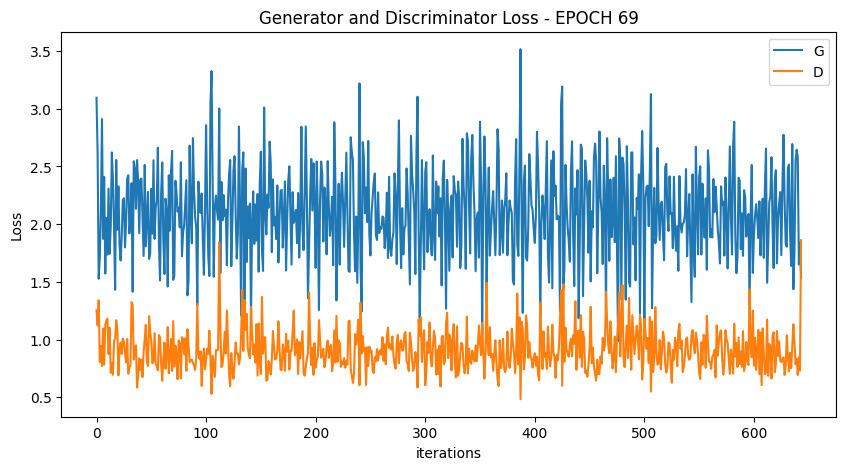

  0%|          | 0/644 [00:00<?, ?it/s]

[71/100][322/644] Loss_D: 1.0981 Loss_G: 2.1782 D(x): 0.6094 D(G(z)): 0.3591 / 0.1084
[71/100][644/644] Loss_D: 1.5301 Loss_G: 2.2596 D(x): 0.2563 D(G(z)): 0.1466 / 0.1129


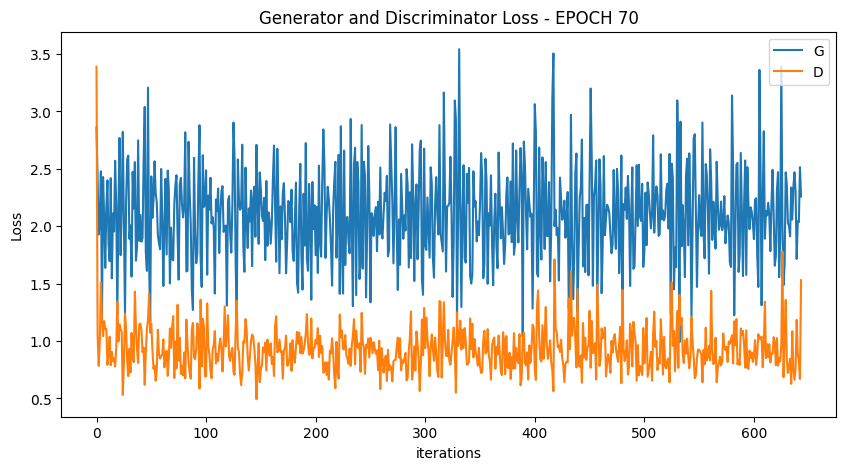

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


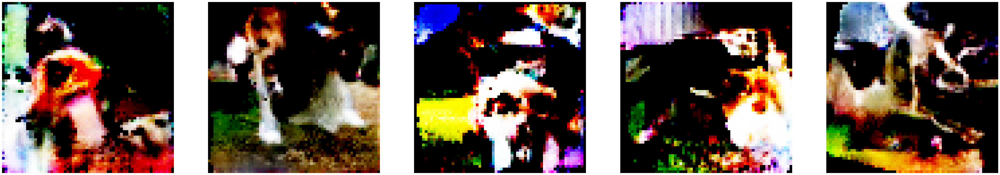

  0%|          | 0/644 [00:00<?, ?it/s]

[72/100][322/644] Loss_D: 0.6638 Loss_G: 2.6127 D(x): 0.6860 D(G(z)): 0.1036 / 0.0733
[72/100][644/644] Loss_D: 1.0800 Loss_G: 3.3132 D(x): 0.5038 D(G(z)): 0.1722 / 0.0319


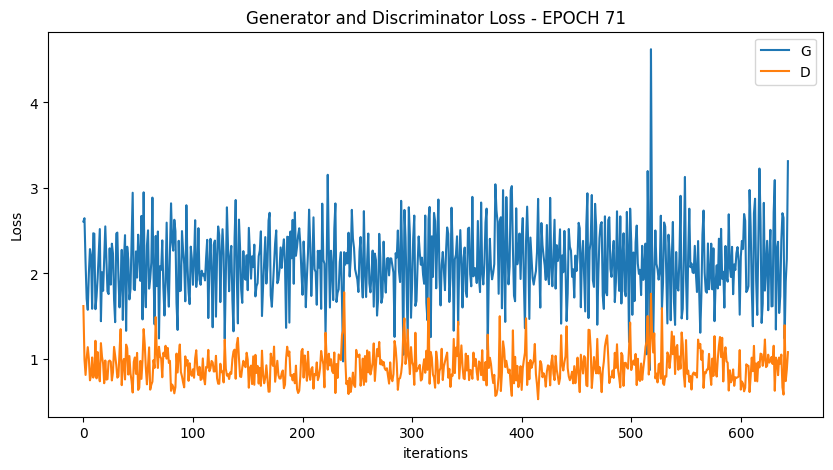

  0%|          | 0/644 [00:00<?, ?it/s]

[73/100][322/644] Loss_D: 0.8042 Loss_G: 2.1355 D(x): 0.5768 D(G(z)): 0.1385 / 0.1237
[73/100][644/644] Loss_D: 1.1231 Loss_G: 2.1058 D(x): 0.4145 D(G(z)): 0.0832 / 0.1062


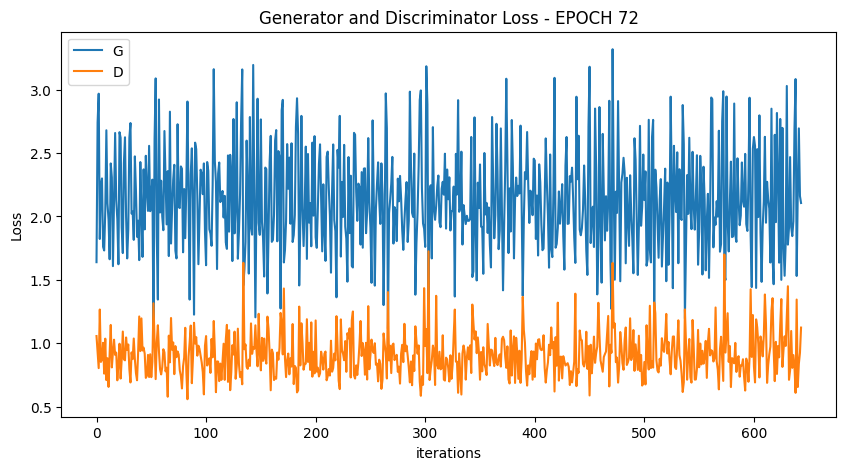

  0%|          | 0/644 [00:00<?, ?it/s]

[74/100][322/644] Loss_D: 1.1841 Loss_G: 1.4277 D(x): 0.4420 D(G(z)): 0.1819 / 0.2706
[74/100][644/644] Loss_D: 1.5272 Loss_G: 1.6830 D(x): 0.3201 D(G(z)): 0.1127 / 0.1625


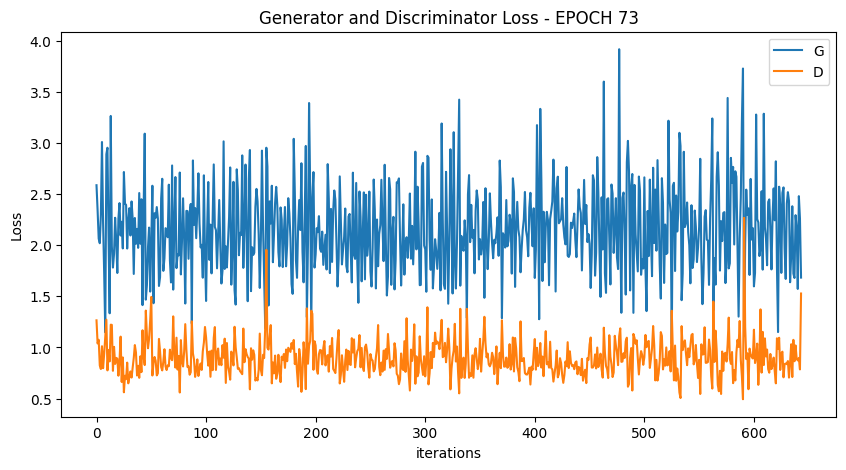

  0%|          | 0/644 [00:00<?, ?it/s]

[75/100][322/644] Loss_D: 0.8940 Loss_G: 2.7472 D(x): 0.9410 D(G(z)): 0.3792 / 0.0562
[75/100][644/644] Loss_D: 1.3925 Loss_G: 6.2377 D(x): 0.4232 D(G(z)): 0.3624 / 0.0019


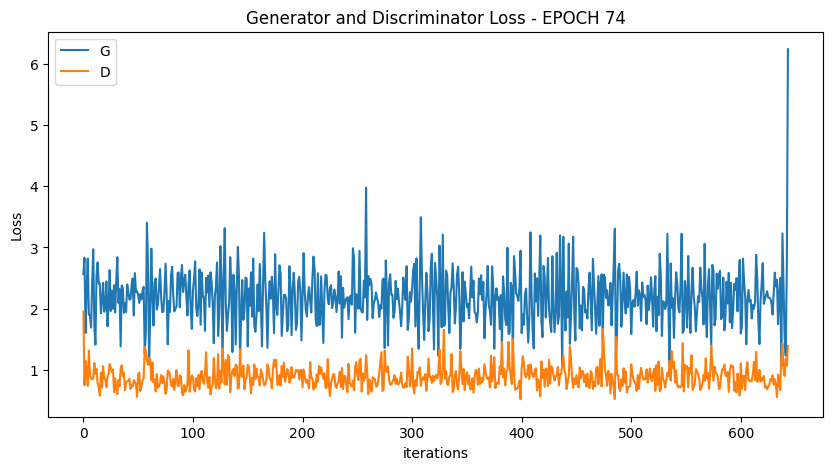

  0%|          | 0/644 [00:00<?, ?it/s]

[76/100][322/644] Loss_D: 0.9066 Loss_G: 1.7450 D(x): 0.6328 D(G(z)): 0.2373 / 0.1654
[76/100][644/644] Loss_D: 0.5944 Loss_G: 4.7421 D(x): 0.9264 D(G(z)): 0.1944 / 0.0088


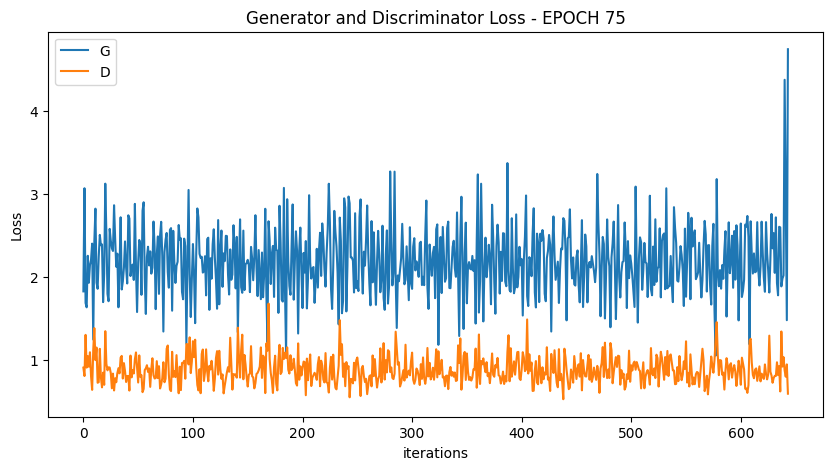

  0%|          | 0/644 [00:00<?, ?it/s]

[77/100][322/644] Loss_D: 0.6680 Loss_G: 2.2804 D(x): 0.6640 D(G(z)): 0.1138 / 0.1194
[77/100][644/644] Loss_D: 0.6384 Loss_G: 6.0376 D(x): 0.8057 D(G(z)): 0.2203 / 0.0019


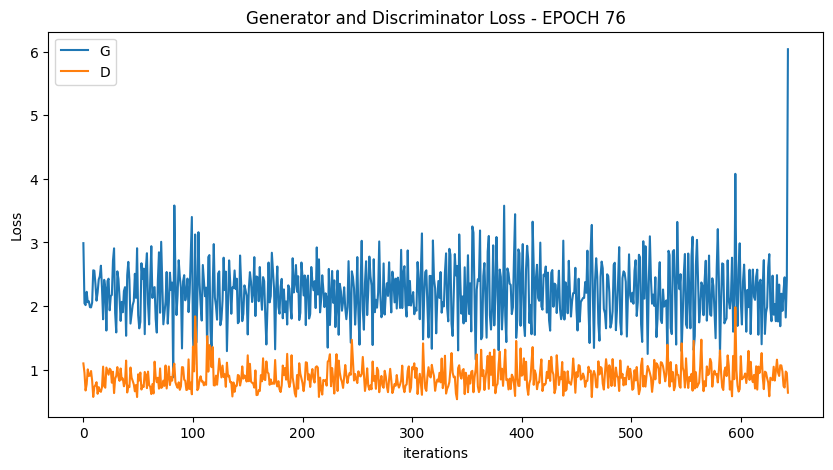

  0%|          | 0/644 [00:00<?, ?it/s]

[78/100][322/644] Loss_D: 0.9741 Loss_G: 2.6752 D(x): 0.7543 D(G(z)): 0.3690 / 0.0792
[78/100][644/644] Loss_D: 1.0584 Loss_G: 2.0470 D(x): 0.4270 D(G(z)): 0.0783 / 0.1663


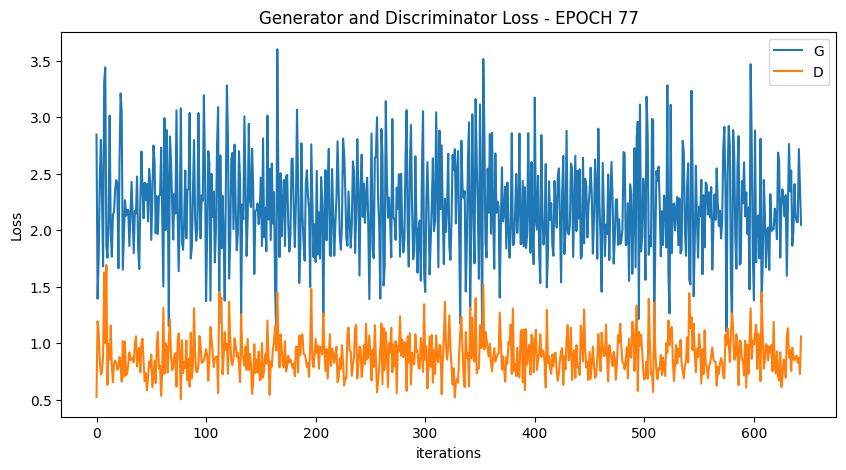

  0%|          | 0/644 [00:00<?, ?it/s]

[79/100][322/644] Loss_D: 0.8925 Loss_G: 2.2125 D(x): 0.5185 D(G(z)): 0.1240 / 0.1317
[79/100][644/644] Loss_D: 0.7729 Loss_G: 2.2675 D(x): 0.5081 D(G(z)): 0.0258 / 0.0855


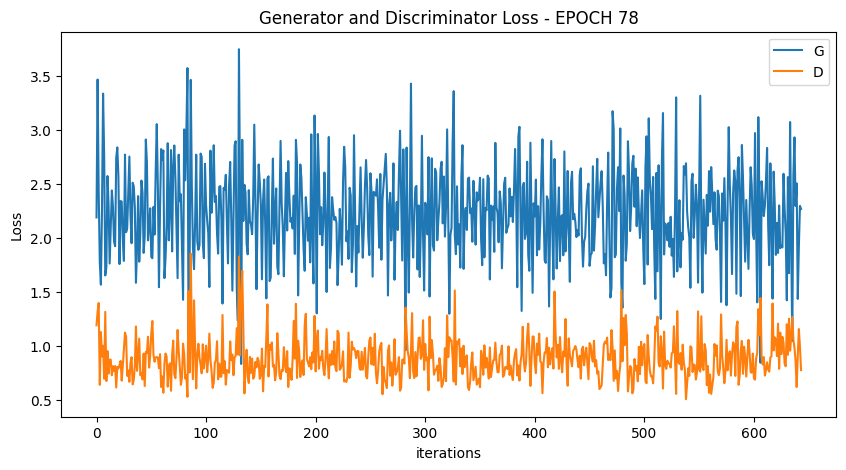

  0%|          | 0/644 [00:00<?, ?it/s]

[80/100][322/644] Loss_D: 0.8018 Loss_G: 2.0880 D(x): 0.5862 D(G(z)): 0.1193 / 0.1285
[80/100][644/644] Loss_D: 0.8023 Loss_G: 5.1478 D(x): 0.7164 D(G(z)): 0.1900 / 0.0183


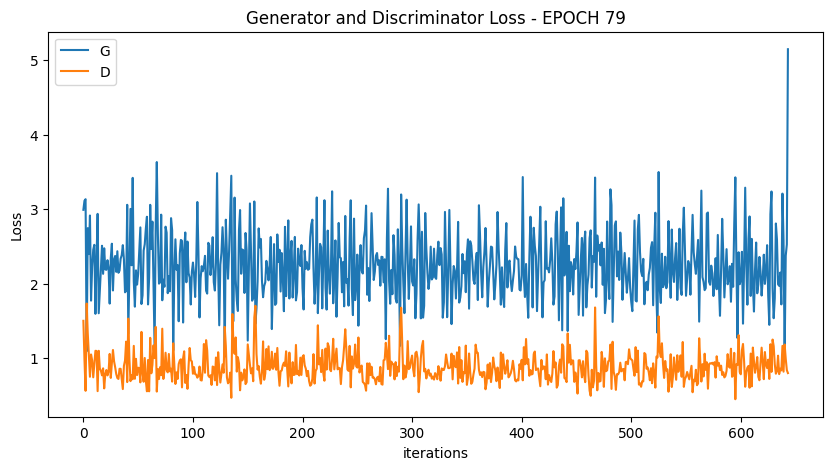

  0%|          | 0/644 [00:00<?, ?it/s]

[81/100][322/644] Loss_D: 1.1242 Loss_G: 1.9457 D(x): 0.5856 D(G(z)): 0.2743 / 0.1570
[81/100][644/644] Loss_D: 0.6021 Loss_G: 5.3572 D(x): 0.9196 D(G(z)): 0.1575 / 0.0039


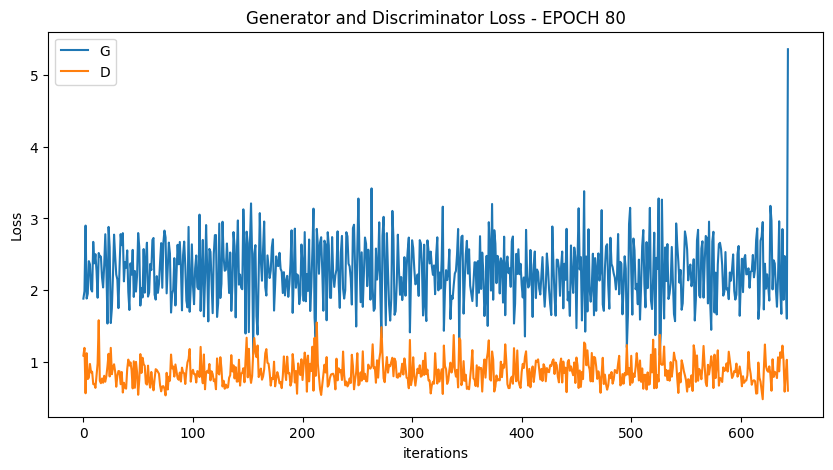

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


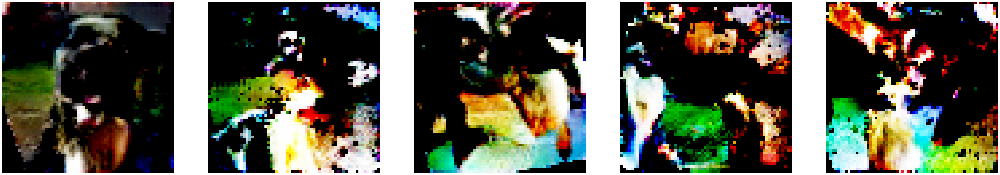

  0%|          | 0/644 [00:00<?, ?it/s]

[82/100][322/644] Loss_D: 0.7683 Loss_G: 2.4620 D(x): 0.7274 D(G(z)): 0.2266 / 0.0860
[82/100][644/644] Loss_D: 1.4908 Loss_G: 2.5546 D(x): 0.2845 D(G(z)): 0.2035 / 0.2317


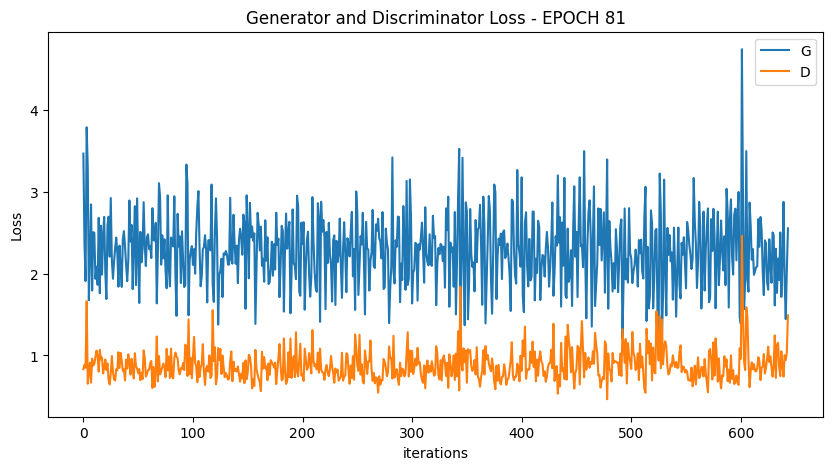

  0%|          | 0/644 [00:00<?, ?it/s]

[83/100][322/644] Loss_D: 1.2829 Loss_G: 2.1434 D(x): 0.6088 D(G(z)): 0.4183 / 0.1163
[83/100][644/644] Loss_D: 0.6093 Loss_G: 3.8156 D(x): 0.7505 D(G(z)): 0.0454 / 0.0293


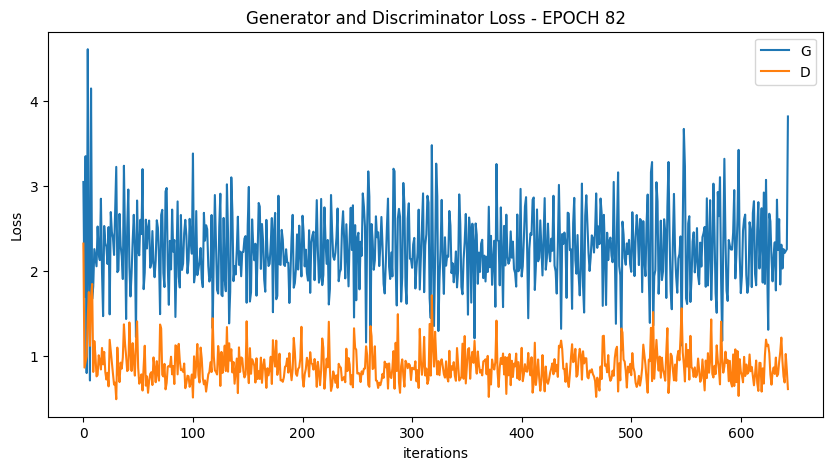

  0%|          | 0/644 [00:00<?, ?it/s]

[84/100][322/644] Loss_D: 1.0609 Loss_G: 1.6962 D(x): 0.4101 D(G(z)): 0.0598 / 0.1980
[84/100][644/644] Loss_D: 1.3699 Loss_G: 3.2381 D(x): 0.3119 D(G(z)): 0.0122 / 0.0322


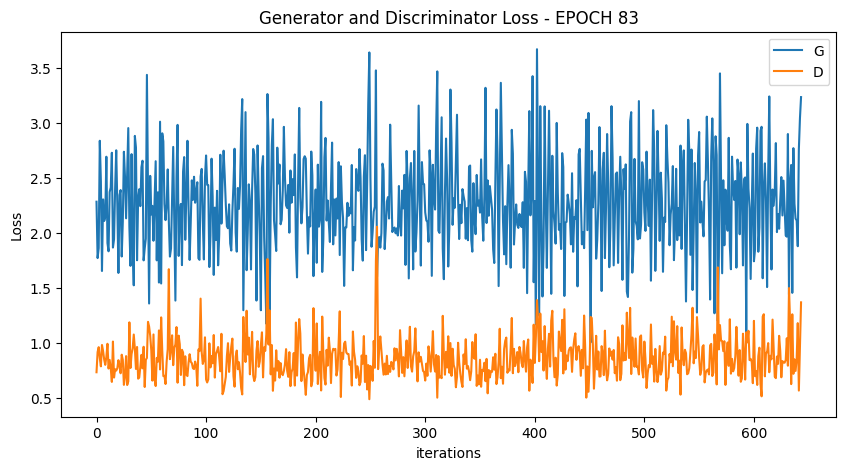

  0%|          | 0/644 [00:00<?, ?it/s]

[85/100][322/644] Loss_D: 1.0530 Loss_G: 2.7133 D(x): 0.7428 D(G(z)): 0.3861 / 0.0670
[85/100][644/644] Loss_D: 2.4208 Loss_G: 10.1877 D(x): 0.4622 D(G(z)): 0.7086 / 0.0001


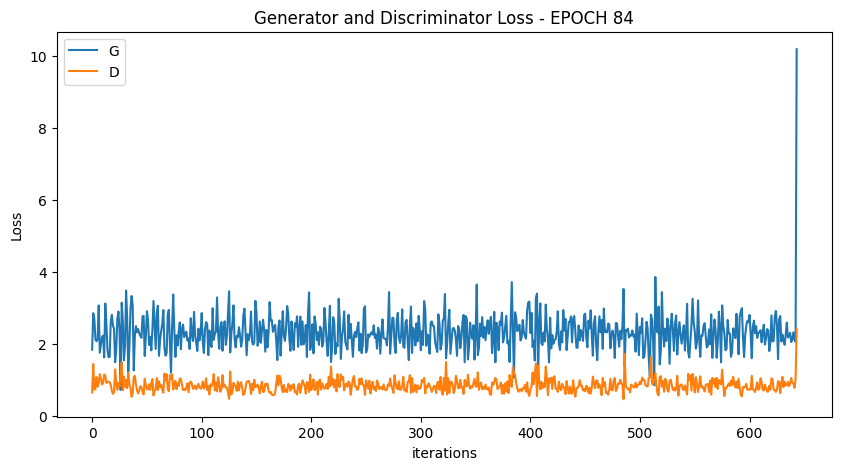

  0%|          | 0/644 [00:00<?, ?it/s]

[86/100][322/644] Loss_D: 0.9958 Loss_G: 2.2596 D(x): 0.6805 D(G(z)): 0.3247 / 0.0984
[86/100][644/644] Loss_D: 0.7231 Loss_G: 4.3570 D(x): 0.6260 D(G(z)): 0.1763 / 0.0118


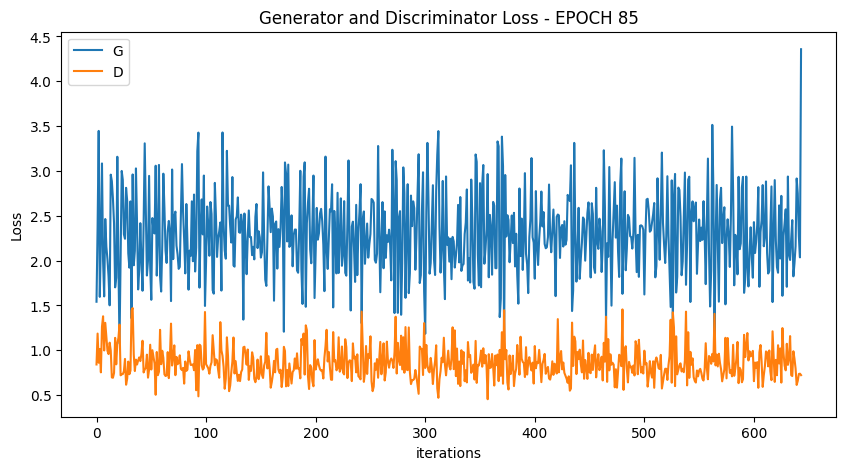

  0%|          | 0/644 [00:00<?, ?it/s]

[87/100][322/644] Loss_D: 0.6873 Loss_G: 2.1716 D(x): 0.7211 D(G(z)): 0.1669 / 0.1176
[87/100][644/644] Loss_D: 1.8742 Loss_G: 1.4446 D(x): 0.1818 D(G(z)): 0.1541 / 0.2158


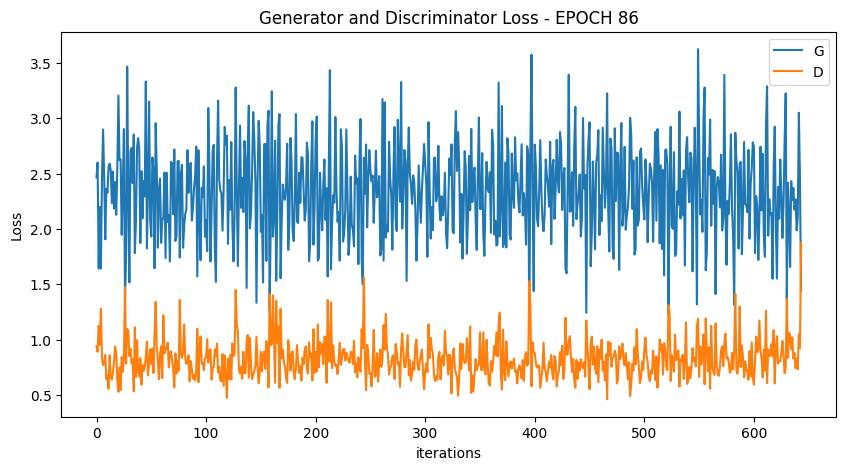

  0%|          | 0/644 [00:00<?, ?it/s]

[88/100][322/644] Loss_D: 0.8787 Loss_G: 2.3173 D(x): 0.7255 D(G(z)): 0.2960 / 0.0941
[88/100][644/644] Loss_D: 0.6522 Loss_G: 3.0361 D(x): 0.6846 D(G(z)): 0.1364 / 0.0522


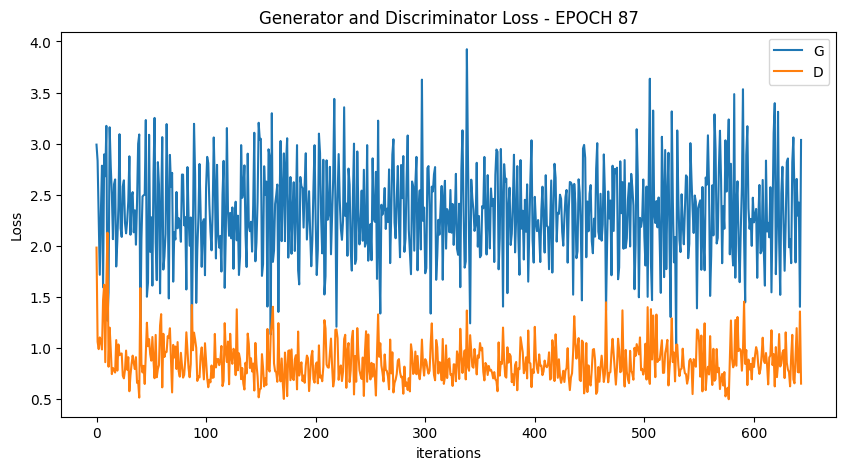

  0%|          | 0/644 [00:00<?, ?it/s]

[89/100][322/644] Loss_D: 0.8689 Loss_G: 2.9730 D(x): 0.9064 D(G(z)): 0.3554 / 0.0479
[89/100][644/644] Loss_D: 0.4338 Loss_G: 4.2599 D(x): 0.9366 D(G(z)): 0.0303 / 0.0111


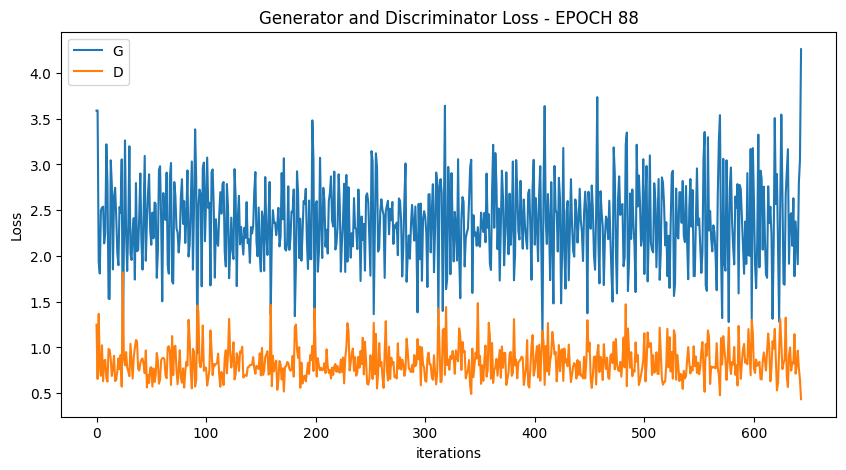

  0%|          | 0/644 [00:00<?, ?it/s]

[90/100][322/644] Loss_D: 1.1705 Loss_G: 2.1555 D(x): 0.4174 D(G(z)): 0.1322 / 0.1218
[90/100][644/644] Loss_D: 1.3061 Loss_G: 1.2148 D(x): 0.2888 D(G(z)): 0.0395 / 0.3216


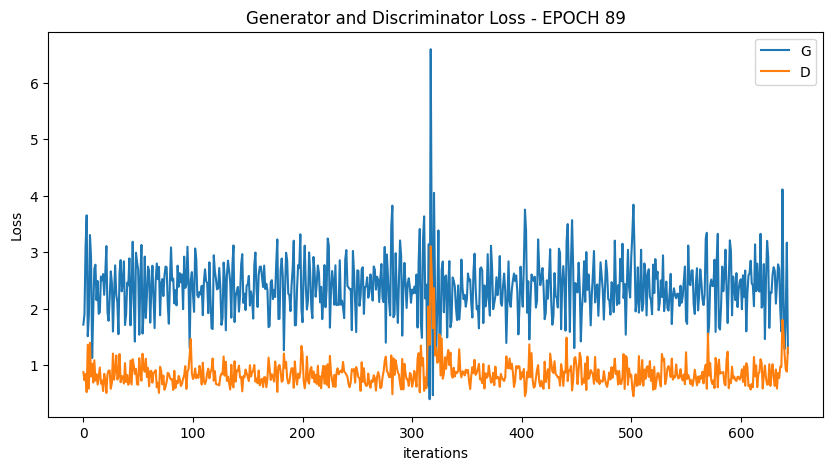

  0%|          | 0/644 [00:00<?, ?it/s]

[91/100][322/644] Loss_D: 1.1203 Loss_G: 2.2189 D(x): 0.4519 D(G(z)): 0.1182 / 0.1488
[91/100][644/644] Loss_D: 1.9144 Loss_G: 1.6915 D(x): 0.1792 D(G(z)): 0.0616 / 0.2175


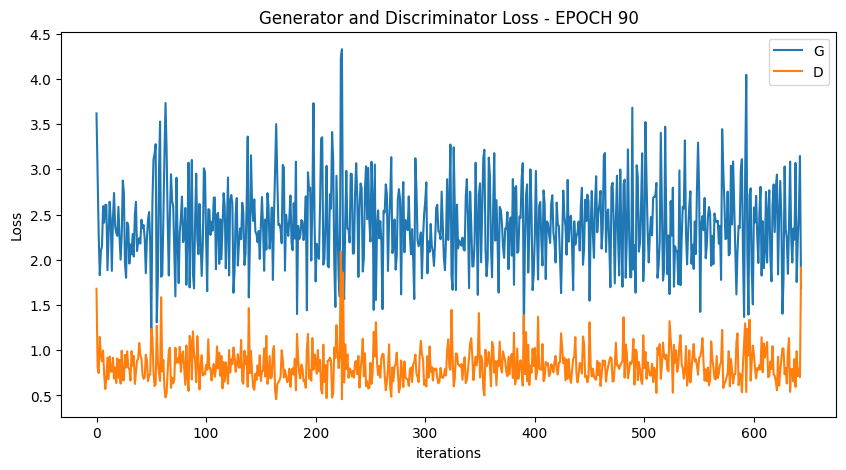

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


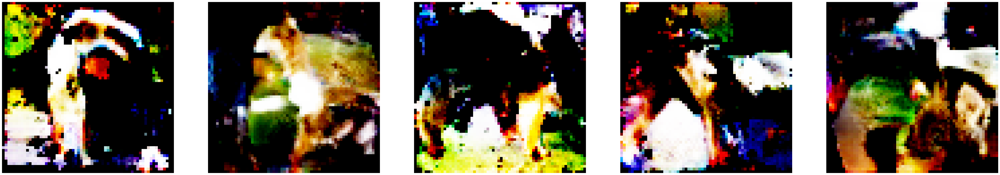

  0%|          | 0/644 [00:00<?, ?it/s]

[92/100][322/644] Loss_D: 0.9478 Loss_G: 2.2729 D(x): 0.6404 D(G(z)): 0.2578 / 0.1025
[92/100][644/644] Loss_D: 0.5795 Loss_G: 3.2885 D(x): 0.7195 D(G(z)): 0.1055 / 0.0317


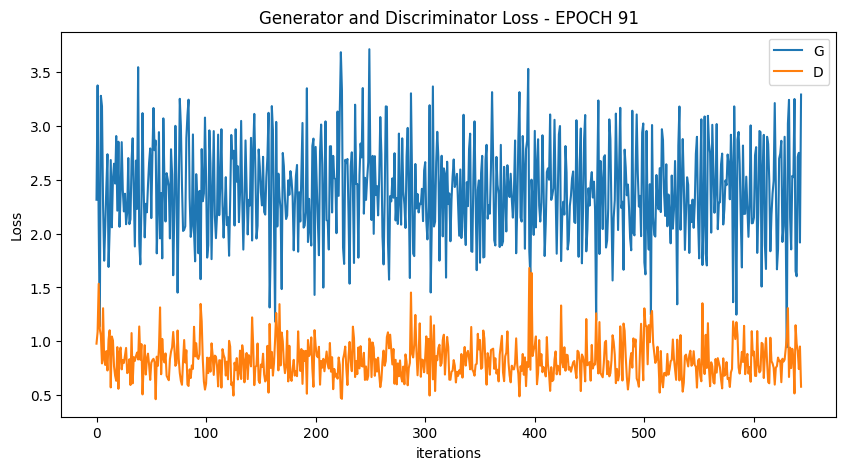

  0%|          | 0/644 [00:00<?, ?it/s]

[93/100][322/644] Loss_D: 0.8079 Loss_G: 3.6619 D(x): 0.8229 D(G(z)): 0.2852 / 0.0247
[93/100][644/644] Loss_D: 2.2568 Loss_G: 1.7528 D(x): 0.1469 D(G(z)): 0.0227 / 0.1756


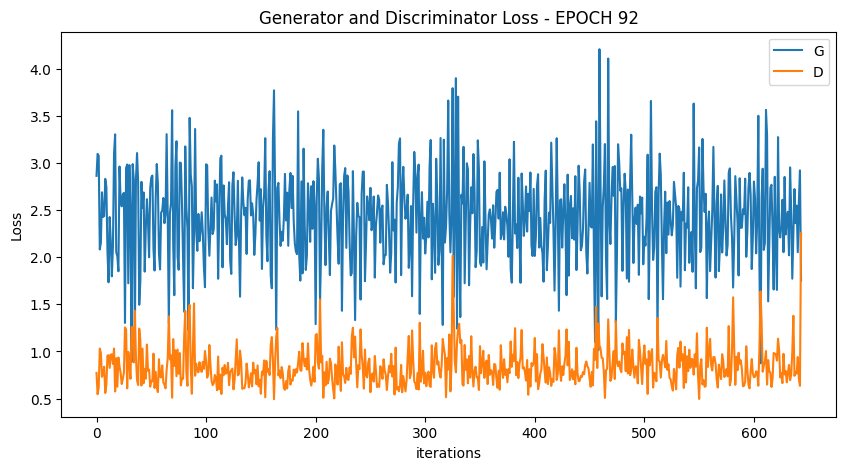

  0%|          | 0/644 [00:00<?, ?it/s]

[94/100][322/644] Loss_D: 0.6557 Loss_G: 2.4811 D(x): 0.7068 D(G(z)): 0.1288 / 0.0905
[94/100][644/644] Loss_D: 1.2488 Loss_G: 7.6843 D(x): 0.5579 D(G(z)): 0.4046 / 0.0023


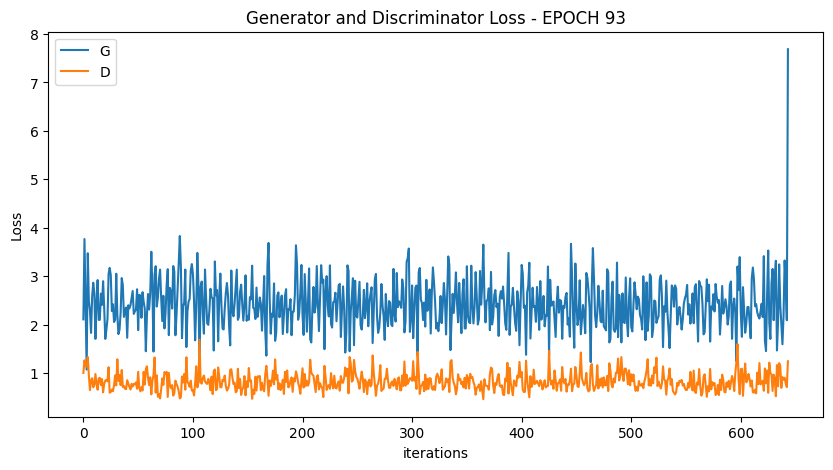

  0%|          | 0/644 [00:00<?, ?it/s]

[95/100][322/644] Loss_D: 1.1340 Loss_G: 1.6856 D(x): 0.4346 D(G(z)): 0.0974 / 0.1925
[95/100][644/644] Loss_D: 0.9145 Loss_G: 8.6248 D(x): 0.8453 D(G(z)): 0.3973 / 0.0003


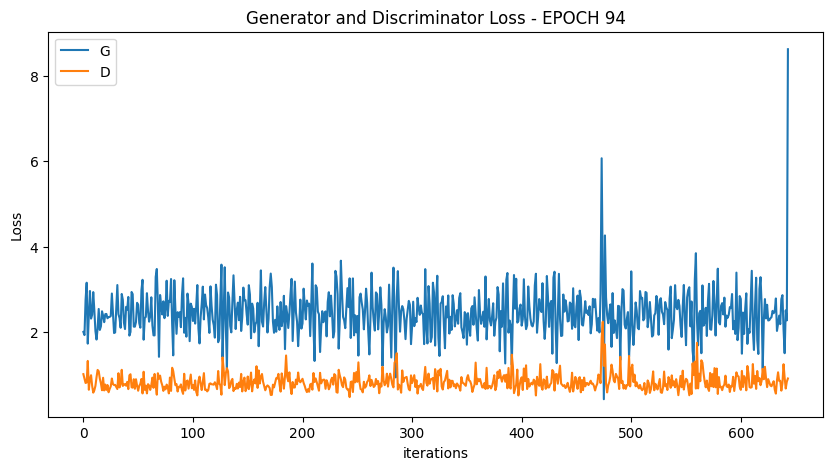

  0%|          | 0/644 [00:00<?, ?it/s]

[96/100][322/644] Loss_D: 0.7333 Loss_G: 3.0846 D(x): 0.7614 D(G(z)): 0.2016 / 0.0490
[96/100][644/644] Loss_D: 0.6443 Loss_G: 3.6685 D(x): 0.6780 D(G(z)): 0.0113 / 0.0257


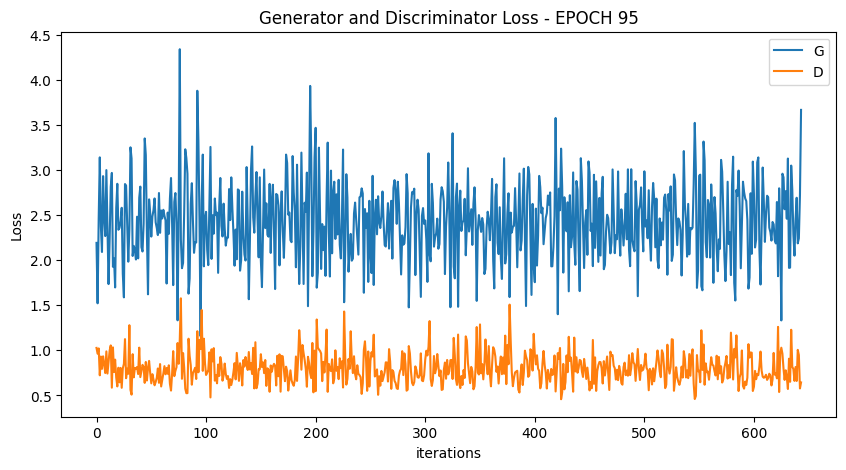

  0%|          | 0/644 [00:00<?, ?it/s]

[97/100][322/644] Loss_D: 0.6312 Loss_G: 2.6528 D(x): 0.7756 D(G(z)): 0.1457 / 0.0771
[97/100][644/644] Loss_D: 0.7521 Loss_G: 4.9404 D(x): 0.6948 D(G(z)): 0.1821 / 0.0107


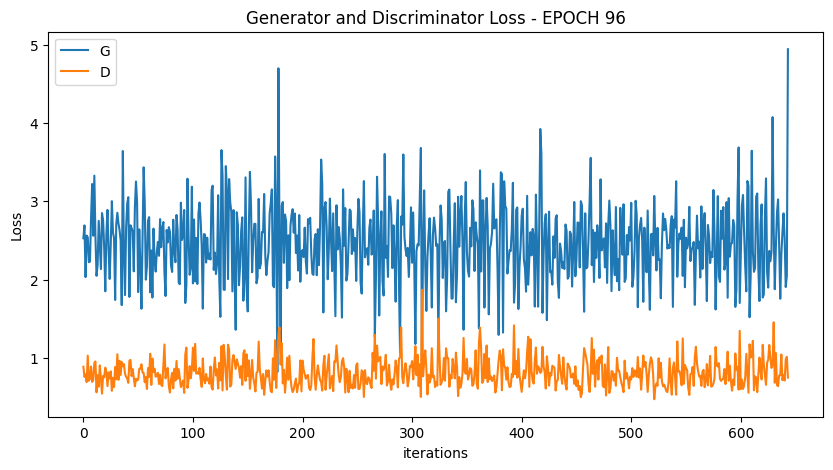

  0%|          | 0/644 [00:00<?, ?it/s]

[98/100][322/644] Loss_D: 0.8497 Loss_G: 2.3019 D(x): 0.7966 D(G(z)): 0.2576 / 0.1008
[98/100][644/644] Loss_D: 0.9195 Loss_G: 3.4253 D(x): 0.5686 D(G(z)): 0.1360 / 0.0231


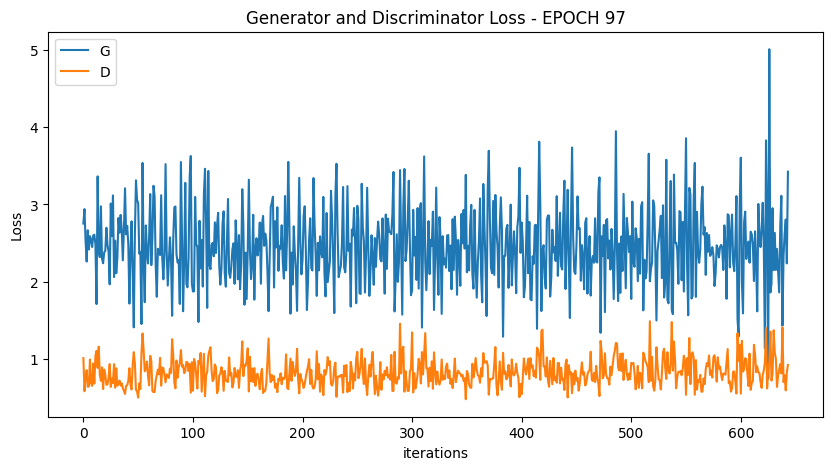

  0%|          | 0/644 [00:00<?, ?it/s]

[99/100][322/644] Loss_D: 0.7155 Loss_G: 2.1882 D(x): 0.6943 D(G(z)): 0.1667 / 0.1333
[99/100][644/644] Loss_D: 0.6474 Loss_G: 3.5452 D(x): 0.5504 D(G(z)): 0.0187 / 0.0219


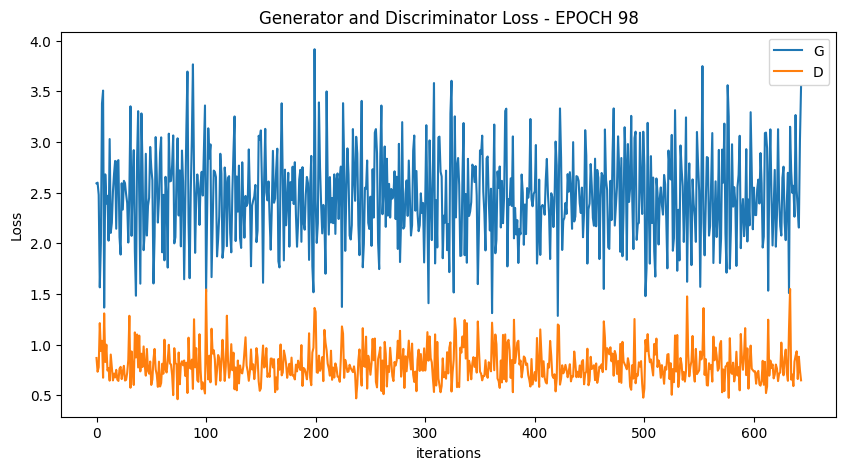

  0%|          | 0/644 [00:00<?, ?it/s]

[100/100][322/644] Loss_D: 0.7297 Loss_G: 2.2451 D(x): 0.6751 D(G(z)): 0.1581 / 0.0999
[100/100][644/644] Loss_D: 1.2880 Loss_G: 2.4905 D(x): 0.3125 D(G(z)): 0.0070 / 0.0730


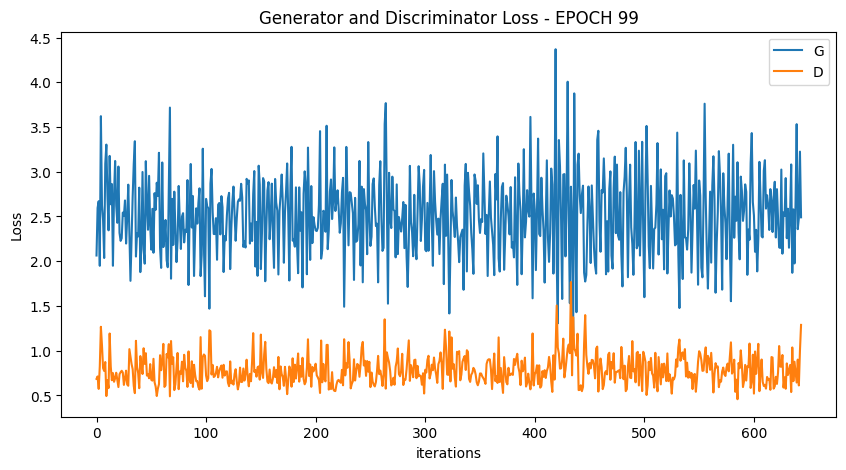

In [18]:
for epoch in range(epochs):
    
    start = time.time()
    for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        # train with real
        netD.zero_grad()
        real_images = real_images.to(device)
        batch_size = real_images.size(0)
        labels = torch.full((batch_size, 1), real_label, device=device)

        output = netD(real_images)
        errD_real = criterion(output, labels)
        errD_real.backward()
        D_x = output.mean().item()

        # train with fake
        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake = netG(noise)
        labels.fill_(fake_label)
        output = netD(fake.detach())
        errD_fake = criterion(output, labels)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        labels.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake)
        errG = criterion(output, labels)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        if (ii+1) % (len(train_loader)//2) == 0:
            print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                  % (epoch + 1, epochs, ii+1, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            
    plot_loss (G_losses, D_losses, epoch)
    G_losses = []
    D_losses = []
    if epoch % 10 == 0:
        show_generated_img()

    epoch_time.append(time.time()- start)
    
#             valid_image = netG(fixed_noise)


In [19]:
print (">> average EPOCH duration = ", np.mean(epoch_time))

>> average EPOCH duration =  3119.231085457802


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


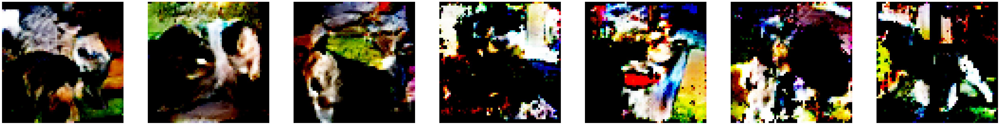

In [20]:
show_generated_img(7)

In [1]:
if not os.path.exists('../output_images'):
    os.mkdir('../output_images')
    
im_batch_size = 50
n_images=10000

for i_batch in tqdm(range(0, n_images, im_batch_size)):
    gen_z = torch.randn(im_batch_size, nz, 1, 1, device=device)
    gen_images = netG(gen_z)
    images = gen_images.to("cpu").clone().detach()
    images = images.numpy().transpose(0, 2, 3, 1)
    for i_image in range(gen_images.size(0)):
        save_image(gen_images[i_image, :, :, :], os.path.join('../output_images', f'image_{i_batch+i_image:05d}.png'))

NameError: name 'os' is not defined

In [22]:
import shutil
shutil.make_archive('images', 'zip', '../output_images')

'/Users/poppy/Jupyter-notebook/GANs/images.zip'

In [23]:
torch.save(netG.state_dict(), 'generator.pth')
torch.save(netD.state_dict(), 'discriminator.pth')

NameError: name 'nn' is not defined

In [33]:
# Tạo mạng Generator mới có cùng cấu trúc với mạng đã huấn luyện
new_netG = Generator(nz).to(device)

# Tải trọng số đã lưu vào mạng Generator mới
new_netG.load_state_dict(torch.load('generator.pth'))

# Chuyển mạng Generator sang chế độ dự đoán
new_netG.eval()

# Tạo các vector nhiễu ngẫu nhiên
noise = torch.randn(batch_size, nz, 2, 1, device=device)

# Sinh ra các ảnh mới từ mạng Generator
with torch.no_grad():
    generated_images = new_netG(noise)
    print(generated_images)

tensor([[[[-0.4664, -0.5055, -0.5514,  ..., -0.2611, -0.2738, -0.2016],
          [-0.4650, -0.5189, -0.4225,  ..., -0.1820, -0.2126, -0.2707],
          [-0.2652, -0.2911, -0.1710,  ..., -0.1987, -0.2229, -0.1897],
          ...,
          [-0.7833, -0.8487, -0.8197,  ..., -0.2463, -0.3316, -0.3903],
          [-0.7593, -0.8780, -0.8759,  ..., -0.2250, -0.2902, -0.4138],
          [-0.8528, -0.8869, -0.9016,  ..., -0.2720, -0.3078, -0.4230]],

         [[-0.4612, -0.5203, -0.4857,  ..., -0.2873, -0.3582, -0.2833],
          [-0.4780, -0.4708, -0.3466,  ..., -0.2217, -0.2771, -0.3141],
          [-0.2822, -0.2206, -0.0970,  ..., -0.2701, -0.2908, -0.3083],
          ...,
          [-0.7931, -0.8268, -0.7978,  ..., -0.2460, -0.3043, -0.3979],
          [-0.7379, -0.8685, -0.8673,  ..., -0.2259, -0.2980, -0.4815],
          [-0.8207, -0.8694, -0.8810,  ..., -0.2903, -0.2798, -0.4395]],

         [[-0.5736, -0.5565, -0.5195,  ..., -0.4977, -0.4928, -0.3822],
          [-0.5533, -0.5514, -

In [ ]:

import matplotlib.pyplot as plt

# Xác định kích thước và số lượng cột cho lưới hiển thị hình ảnh
num_images = 50
num_cols = 5
num_rows = num_images // num_cols

# Hiển thị hình ảnh
plt.figure(figsize=(10, 8))
for i in range(num_images):
    plt.subplot(num_rows, num_cols, i + 1)
    # Đảo lại thứ tự kích thước của hình ảnh từ (C, H, W) sang (H, W, C) nếu cần thiết
    image = generated_images[i].cpu().detach().numpy().transpose(1, 2, 0)
    # Hiển thị hình ảnh
    plt.imshow(image)
    plt.axis('off')

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i